In [1]:
from mpl_toolkits import mplot3d
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy import stats
from fit_pesato_3 import fit
from scipy.optimize import fsolve
from seaborn import heatmap
import math


In [2]:
file_name = r"sht75_nblab03_Hum_Temp_RUN_20221221080550_1_h.txt"
data_all = pd.read_csv(file_name, sep=" ", header=0)


In [3]:
len(data_all)

28251

In [4]:
d = data_all.drop(index = 0)
data = d.reset_index()

In [5]:
data["temp_corr"][0]

21.84

In [6]:
len(data)

28250

In [7]:
data.tail()

,index,n,anno,mese,giorno,hum_int,hum_corrected,RH_raw,RH_true,temp_int,temp_corr
28245,28246,28246,2022,12,21,39948.4,10798.750463,1509,49.28,6134,21.74
28246,28247,28247,2022,12,21,39949.4,10799.151087,1508,49.24,6135,21.75
28247,28248,28248,2022,12,21,39949.4,10799.551760,1508,49.24,6134,21.74
28248,28249,28249,2022,12,21,39950.4,10799.952324,1508,49.24,6134,21.74
28249,28250,28250,2022,12,21,39950.4,10800.352982,1509,49.27,6134,21.74


Fin qua ho solo tolto la prima riga, importato i pacchetti e i dati. Niente di importante. L'equazione della retta alla quale si fa riferimento nella prossima sezione è $y = mx+q$


In [8]:
def media(a):
    l =len(a)
    sum = 0
    for i in a:
        if np.isnan(i)== False :
            sum+= i
    return sum/l 
def gaussiana(lista,step = 0.001):
    media_u= np.mean(lista)
    sigma_u =np.std(lista)
    x = np.arange(media_u-sigma_u*4, media_u+sigma_u*4, step)
    y = [stats.norm.pdf(i,media_u, sigma_u) for i in x] 
    return [x, y]


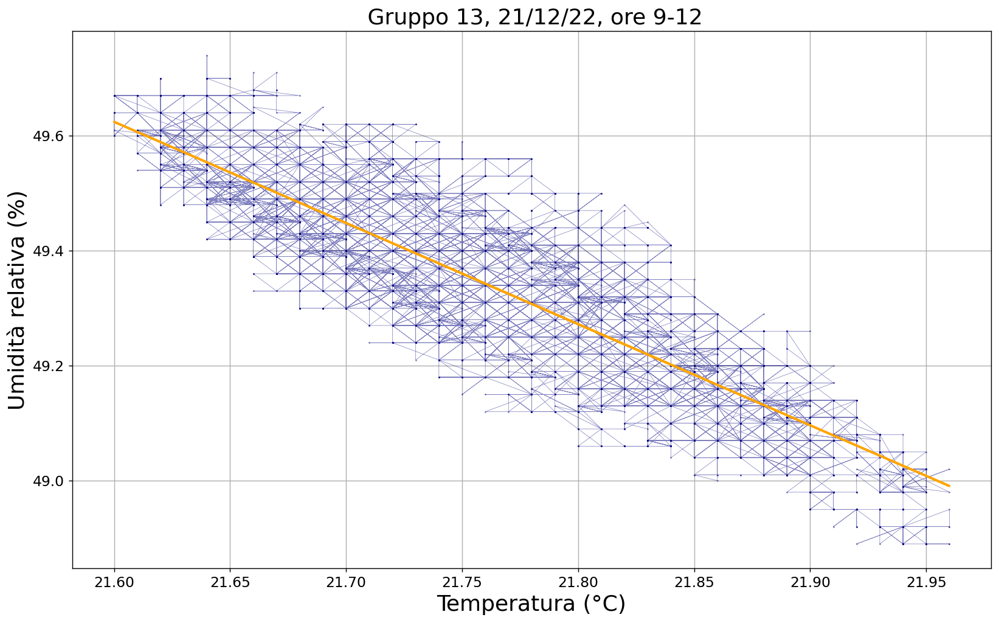

In [9]:
plt.figure(figsize =(15,9),dpi = 130)
plt.plot(data["temp_corr"] , data["RH_true"] , "-o",  alpha = 0.5, color = "navy", markersize  =0.5, linewidth = 0.4)
plt.xlabel("Temperatura (°C)", fontsize = 20)
plt.ylabel("Umidità relativa (%)", fontsize = 20)
#plt.ylim(58.4,58.9)
plt.title(" Gruppo 13, 21/12/22, ore 9-12", fontsize = 20)
e = [0.01 for i in range (len(data["temp_corr"]))]
result = fit(data["temp_corr"], data["RH_true"], e)
plt.xticks(fontsize = 13)
plt.yticks(fontsize = 13)
m, q = result[1], result[0]
retta = [ m*i +q for i in data["temp_corr"] ]
plt.grid(True)
plt.plot(data["temp_corr"] , retta, color = "orange", linewidth= 2)
residuals = []
for i in range(len(data["temp_corr"])):
    r = (data["RH_true"][i]-(m*data["temp_corr"][i]+q))/data["RH_true"][i]
    residuals.append(r)

In [10]:
print(m,q)

-1.760047972383496 87.64138047193933


**ANALISI DEI RESIDUI**

In [11]:
res_st = np.std(residuals)

In [12]:
time = [i*0.4 for i in range(len(data["temp_corr"]))]

0.0004247787610619459


-0.004149393544995878

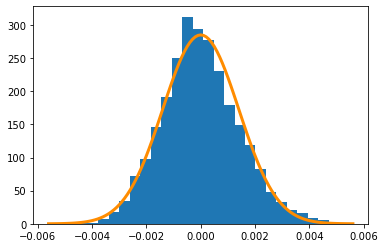

In [13]:
hh = plt.hist(residuals,bins= 25, density = True)
distribution = gaussiana (residuals,0.0001)
plt.plot(distribution[0],distribution[1], linewidth = 3, color = "darkorange")
integral = 0
for i in range(1):
    integral += (hh[0][-i]*(hh[1][-i-1]-hh[1][-i-2])+hh[0][i]*(hh[1][i+1]-hh[1][i]))
print(integral)
hh[1][1]
#print(hh)

In [14]:
hh[1][0]

-0.004534539757216097

In [15]:
hh[1][0]/np.std(residuals)

-3.238894324413701

In [16]:
hh[1][-1]

0.005094115548289374

La distribuzione sembra in prima approssimazione quella gaussiana. Tuttavia, per un numero così elevato di eventi, non ci aspetteremmo le asimmetrie che presenta. L'integrale delle code estreme sull'istogramm, o meglio $\int_{ -\infty}^{\approx -0.00415}f_{exp}(x) dx + \int_{\approx 0.005094}^{\infty} f_{exp}(x) dx \approx$
mi sto ingrippando mani e piedi


(array([-0.006, -0.004, -0.002,  0.   ,  0.002,  0.004,  0.006]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

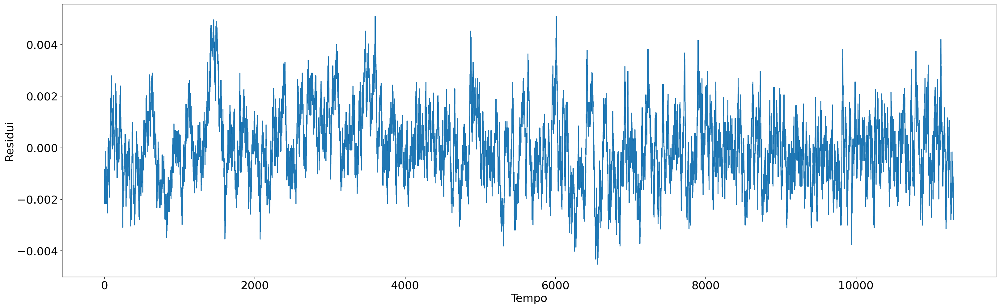

In [17]:
plt.figure(figsize =(30,9),dpi = 130)

plt.xlabel("Tempo", fontsize = 20)
plt.ylabel("Residui", fontsize = 20)
plt.plot(time, residuals)
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)


(array([-0.006, -0.004, -0.002,  0.   ,  0.002,  0.004,  0.006]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

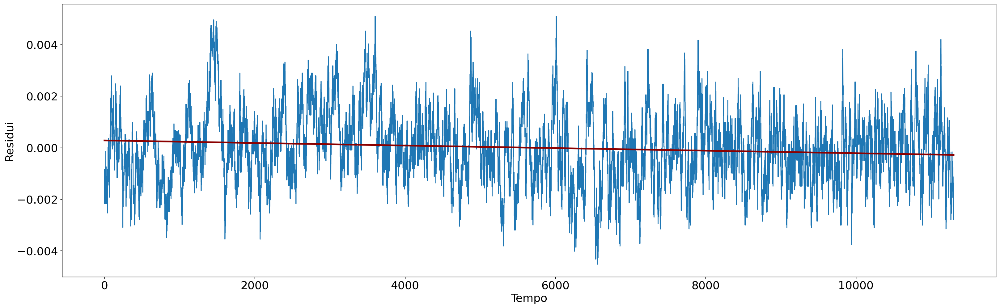

In [18]:
plt.figure(figsize =(30,9),dpi = 130)
time = [i*0.4 for i in range(len(data["temp_corr"]))]
err = [res_st for i in range(len(data["temp_corr"]))]
retta_res = fit(time,residuals, err)
model = [retta_res[0]+f*retta_res[1] for f in time]
plt.plot(time,residuals)
plt.plot(time,model, color= "darkred", linewidth = 3)
plt.xlabel("Tempo", fontsize = 20)
plt.ylabel("Residui", fontsize = 20)
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)

In [19]:
def resfunction(z, output =False ) :
    a,b = z
    resu = []
    for i in range(len(data["temp_corr"])):
        r = (data["RH_true"][i]-(a*data["temp_corr"][i]+b))/data["RH_true"][i]
        resu.append(r)  
    res_st = np.std(resu)
    time = [i*0.4 for i in range(len(data["temp_corr"]))]
    err = [res_st for i in range(len(data["temp_corr"]))]
    result  = fit(time,resu, err)[1]
    if output ==False:
        return result
    else:
        return resu

IGNORA QUESTA SEZIONE


In [20]:
print(m,q)
delta = 0.1
n = 20

-1.760047972383496 87.64138047193933


In [21]:
xs = np.linspace (m-delta,m+delta,n)
ys = np.linspace (q-delta,q+delta,n)

matr = np.zeros((n,n))

In [22]:
"""matr = np.zeros((n,n))
for i in range(n):
    for j in range (n):
       matr[i,j] = resfunction([xs[i],ys[j]])"""

'matr = np.zeros((n,n))\nfor i in range(n):\n    for j in range (n):\n       matr[i,j] = resfunction([xs[i],ys[j]])'

In [23]:
def decodeline(stringa):
    l = len(stringa)-1
    i = 0
    n0 = ""
    n1 = ""
    n2 = ""
    n3 = ""
    while stringa[i] == "[" or stringa[i] == " ":
        i= i+1
    while stringa[i] == "[" or stringa[i] == " ":
        i= i+1
    while stringa[i] == "[" or stringa[i] == " ":
        i= i+1
    while stringa[i] != " ":
        n0 += stringa[i]
        i+=1
    while stringa[i] == "[" or stringa[i] == " ":
        i= i+1    
    while stringa[i] != " ":
        n1 += stringa[i]
        i+=1
    while stringa[i] == "[" or stringa[i] == " ":
        i= i+1    
    while stringa[i] != " ":
        n2 += stringa[i]
        i+=1
    while stringa[i] == "[" or stringa[i] == " ":
        i= i+1  
    while  stringa[i] != "]" and i<l:
        n3 += stringa[i]
        i+=1
    return ([float(n0), float(n1), float(n2), float(n3)])
    


In [24]:
file  =open("heatmap20.txt", "r")
print(type(file))
lines = file.readlines()



<class '_io.TextIOWrapper'>


In [25]:
flatlist = []
for q in range(len(lines)):
    lista = decodeline(lines[q])
    flatlist+=lista
    

In [26]:
file.close()

In [27]:
for i in range(n):
    riga = i*10
    for j in range (n):
       matr[i,j] =flatlist[riga+j]

Text(0.5, 1.0, 'Coefficiente angolare della retta dei residui, in funzione della retta iniziale ($y = a*x+b$)')

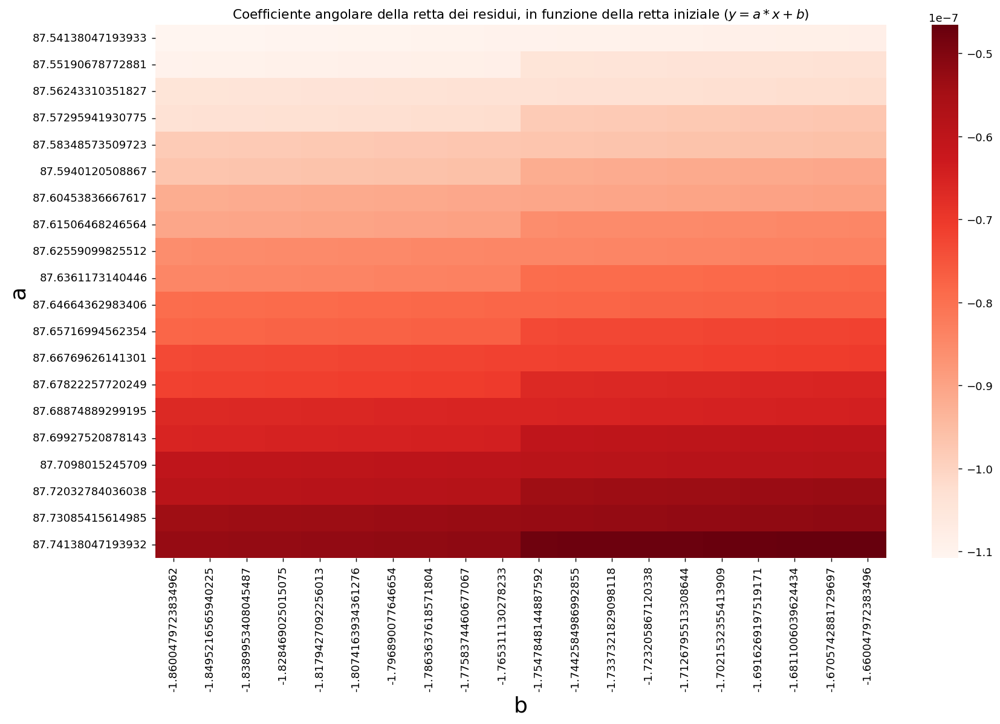

In [28]:
plt.figure(figsize =(15,9),dpi = 130)
plt.xlabel("Coefficiente angolare", fontsize = 20)
plt.ylabel("Intercetta", fontsize = 20)
heat = pd.DataFrame(matr, columns =xs)
s =heatmap(heat, cmap = "Reds", yticklabels=ys)
s.set(xlabel='b', ylabel='a')
plt.title ("Coefficiente angolare della retta dei residui, in funzione della retta iniziale ($y = a*x+b$)")

In [29]:
def rrr(z):
    v = resfunction(z)
    return [v,v]


In [30]:
soluz = fsolve(rrr ,x0 = [m,q] )

In [31]:
soluz

array([-1.74271171, 91.06202007])

In [32]:
flat = resfunction(soluz, True)

Text(0.5, 1.0, 'Residui per m=-1.7427117111229629 e q=91.06202006539739')

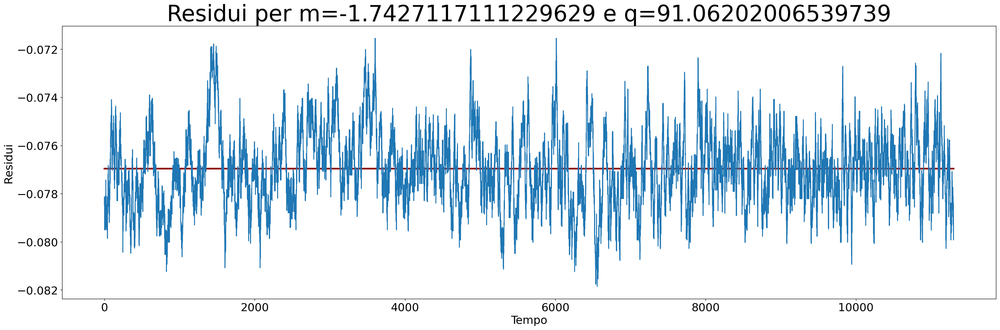

In [33]:

plt.figure(figsize =(30,9),dpi = 130)
devv = np.std(flat)
errors = [devv for i in range(len(data["temp_corr"]))]
retta_res = fit(time,flat, errors)
model_flat = [retta_res[0]+f*retta_res[1] for f in time]
plt.plot(time,model_flat, color= "darkred", linewidth = 3)
plt.xlabel("Tempo", fontsize = 20)
plt.ylabel("Residui ", fontsize = 20)
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.plot(time, flat)
plt.title("Residui per m=" + str(soluz[0]) + " e q=" + str(soluz[1]),fontsize = 40)

Text(0, 0.5, 'Residui')

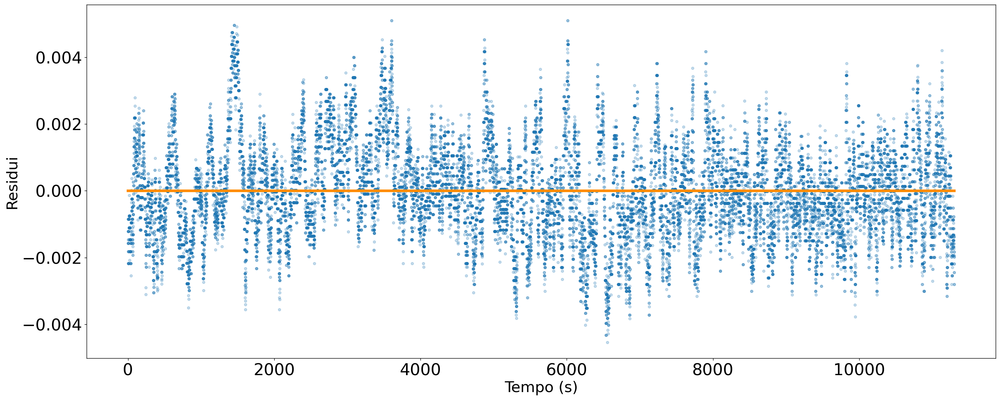

In [34]:
plt.figure(figsize =(25,10),dpi = 130)
plt.scatter(time, residuals, s= 15, alpha = 0.25, label = "residui") 
r_medio= media(residuals)
plt.plot(time, [r_medio for i in time], color = "darkorange", linewidth = 4)
plt.xticks(fontsize = 25)
plt.yticks(fontsize = 25)
plt.xlabel("Tempo (s)", fontsize = 23)
plt.ylabel("Residui", fontsize = 23)

In [35]:
r_medio

-1.9622174311127293e-06

Come si può vedere r_medio è alquanto piccolo




In [36]:
"""n_blocco = 1000
plt.figure(figsize =(25,10),dpi = 130)
plt.scatter(time, residuals, s= 15, alpha = 0.25, label = "residui") 
medie_blocchi = []

plt.plot([time[i] for i in range(n_blocco,len(time),n_blocco)], , color = "darkorange", linewidth = 4)
plt.xticks(fontsize = 25)
plt.yticks(fontsize = 25)
plt.xlabel("Tempo (s)", fontsize = 23)
plt.ylabel("Residui", fontsize = 23)"""

'n_blocco = 1000\nplt.figure(figsize =(25,10),dpi = 130)\nplt.scatter(time, residuals, s= 15, alpha = 0.25, label = "residui") \nmedie_blocchi = []\n\nplt.plot([time[i] for i in range(n_blocco,len(time),n_blocco)], , color = "darkorange", linewidth = 4)\nplt.xticks(fontsize = 25)\nplt.yticks(fontsize = 25)\nplt.xlabel("Tempo (s)", fontsize = 23)\nplt.ylabel("Residui", fontsize = 23)'

**Fine analisi dei residui**

Si può calcolare ora la correlazione tra queste due grandezze


In [37]:
Pearson = data["temp_corr"].corr( data["RH_true"])
print(Pearson)

-0.8791900914556948


 Il risultato è negativo, come atteso, ed è a elevato. Si può calcolare l'errore sulla correlazione grazie alla formula $\sigma_\rho = \sqrt{\frac{1- \rho^2}{n-2}} $


In [38]:
n = len(data["temp_corr"])
delta_rho = np.sqrt((1-Pearson**2)/(n-2))
print(delta_rho)

0.0028349328894374617


In [39]:
def d_rho(x,n):
    return np.sqrt((1-x**2)/(n-2))

Insomma $\rho = -0.879 \pm 0.003$ per tutto il dataset.

Text(0, 0.5, 'Umidità (%)')

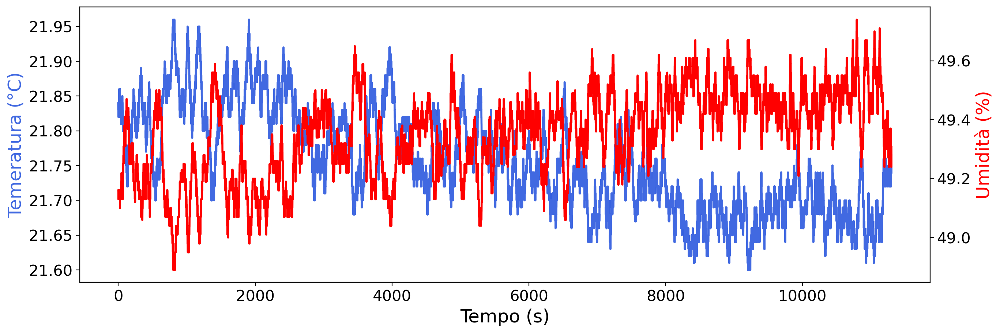

In [40]:

fig,ax = plt.subplots(figsize=(15, 5), dpi= 200)
ax.set_ylabel("Temeratura (°C)", color = "royalblue", fontsize= 18)
ax.plot(time, data["temp_corr"] , color = "royalblue", linewidth = 2 )
plt.xticks(fontsize= 15)
plt.yticks(fontsize= 15)

ax2 = ax.twinx()
ax2.plot(time, data["RH_true"] , color = "red",label ="Umidità (%)", linewidth = 2  )
ax.set_xlabel("Tempo (s)", fontsize= 18)
plt.yticks(fontsize= 15)
ax2.set_ylabel("Umidità (%)",color = "red", fontsize= 18)


Text(0, 0.5, 'Temeratura (°C)')

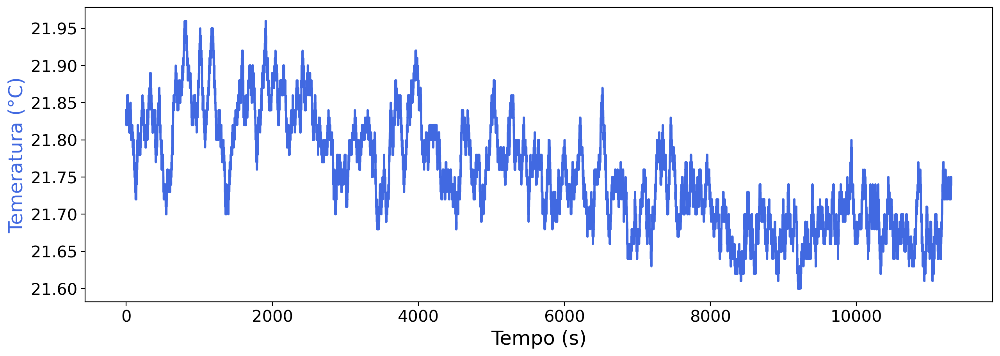

In [41]:
plt.figure(figsize=(15, 5), dpi= 200)
plt.plot(time, data["temp_corr"] , color = "royalblue", linewidth = 2 )
plt.xticks(fontsize= 15)
plt.yticks(fontsize= 15)
plt.xlabel("Tempo (s)", fontsize= 18)
plt.ylabel("Temeratura (°C)", color = "royalblue", fontsize= 18)

Text(0, 0.5, 'Umidità (%)')

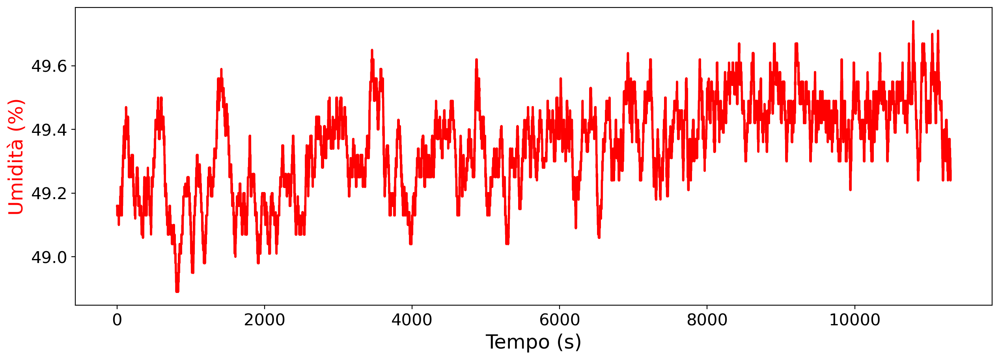

In [42]:
plt.figure(figsize=(15, 5), dpi= 200)
plt.xticks(fontsize= 15)
plt.yticks(fontsize= 15)
plt.plot(time, data["RH_true"] , color = "red",label ="Umidità (%)", linewidth = 2  )
plt.xlabel("Tempo (s)", fontsize= 18)
plt.ylabel("Umidità (%)",color = "red", fontsize= 18)

Il tempo a metà acquisizione è di circa 5650 secondi. Vediamo di dividere il precedente plot in due più piccoli

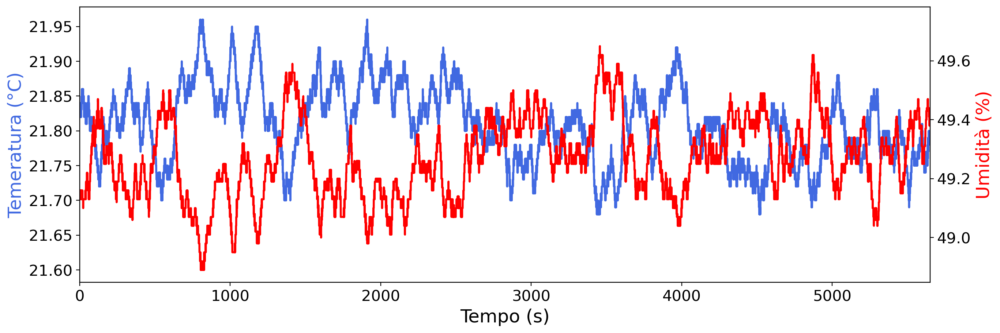

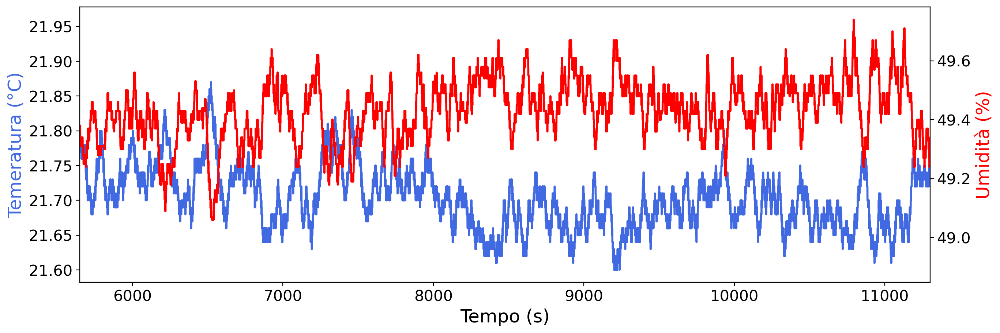

In [43]:
time = [i*0.4 for i in range(len(data["temp_corr"]))]
fig,ax = plt.subplots(figsize=(15, 5), dpi= 200)
ax.set_ylabel("Temeratura (°C)", color = "royalblue", fontsize= 18)
ax.plot(time, data["temp_corr"] , color = "royalblue", linewidth = 2 )
plt.xticks(fontsize= 15)
plt.yticks(fontsize= 15)

ax2 = ax.twinx()
ax2.plot(time, data["RH_true"] , color = "red",label ="Umidità (%)", linewidth = 2  )
ax.set_xlabel("Tempo (s)", fontsize= 18)
plt.yticks(fontsize= 15)
ax2.set_ylabel("Umidità (%)",color = "red", fontsize= 18)
plt.xlim(0,5650)
plt.show()
time = [i*0.4 for i in range(len(data["temp_corr"]))]
fig,ax = plt.subplots(figsize=(15, 5), dpi= 200)
ax.set_ylabel("Temeratura (°C)", color = "royalblue", fontsize= 18)
ax.plot(time, data["temp_corr"] , color = "royalblue", linewidth = 2 )
plt.xticks(fontsize= 15)
plt.yticks(fontsize= 15)

ax2 = ax.twinx()
ax2.plot(time, data["RH_true"] , color = "red",label ="Umidità (%)", linewidth = 2  )
ax.set_xlabel("Tempo (s)", fontsize= 18)
plt.yticks(fontsize= 15)
ax2.set_ylabel("Umidità (%)",color = "red", fontsize= 18)
plt.xlim(5650,11301)
plt.show()

In questi due grafici si evidenzia un'anticorrelazione tra i due fenomeni, come ci si aspettava. Dividere in due il tempo aiuta a visualizzare meglio questa relazione. Possiamo ora graficare in funzione del tempo queste due grandezze


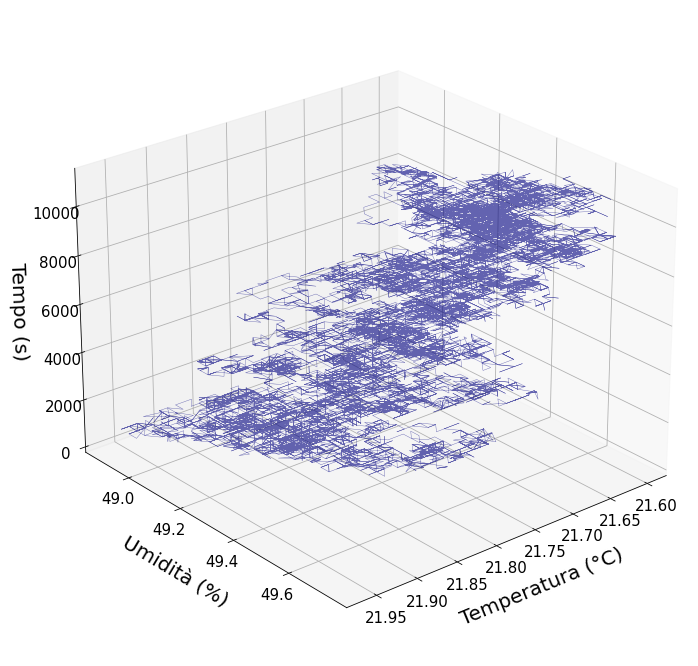

In [44]:
fig = plt.figure(figsize = (13,12))
ax = plt.axes(projection = '3d')

ax.plot3D(data["temp_corr"] , data["RH_true"] ,time,  alpha = 0.6, color = "navy", markersize  =0.5, linewidth = 0.4)
ax.view_init(25, 50)
ax.set_xlabel("Temperatura (°C)", fontsize = 20,labelpad = 15)
ax.set_ylabel("Umidità (%)" ,fontsize = 20,labelpad = 15)
ax.set_zlabel("Tempo (s)", fontsize = 20,labelpad = 15)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.yticks(fontsize = 15)
ax.zaxis.set_tick_params(labelsize=15)


Se devo dividere in 10 sottocampioni una presa dati di un po' più di 11000 dati, posso fare sì che questi siano di 1100. Qui manca la stima dell'errore sulla correlazione. Bisogna poi provare a fare il fit lineare su questi grafichetti




In [45]:
def error_corr(rho,n):
    return  np.sqrt((1-rho**2)/(n-2))
def retta(a,b,x):
    return a*x+b 


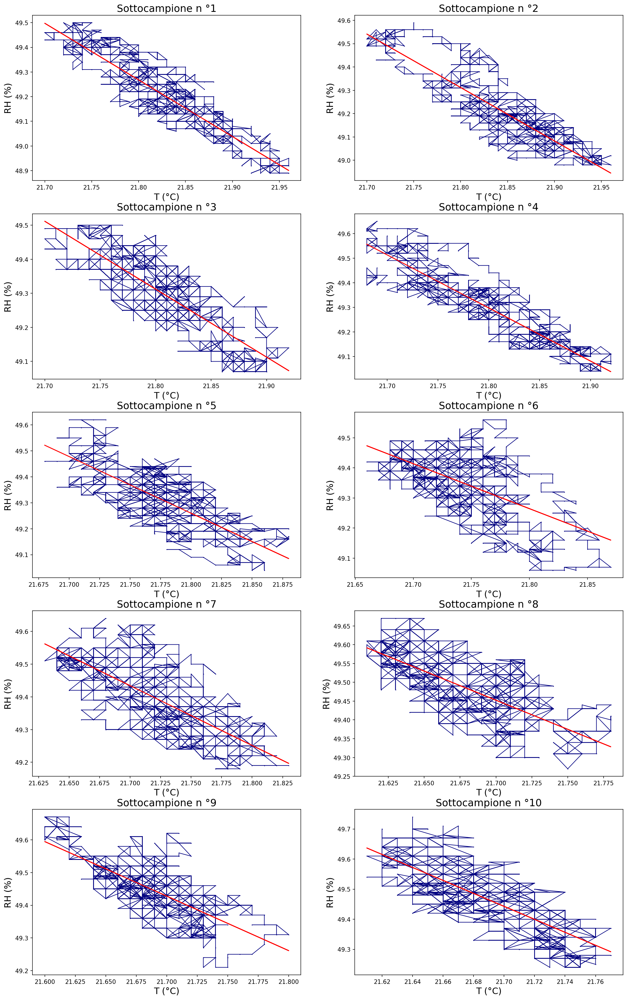

In [46]:
fig, axs = plt.subplots(5,2, figsize = (18,30), dpi = 150)
correlations_10 = []
correlations_errors_10= []
n_data_10 = 2825
fits_10 = []
dataframe_10 = pd.DataFrame()
for q in range (10):
    j = q%2
    i = q//2
    
    step = q*n_data_10
    step_1 = step + n_data_10
    locx ,locy = list(data["temp_corr"][step:step_1]) , list(data["RH_true"][step:step_1])
    localdic = {"x_"+str(q): locx, "y_"+str(q): locy}
    axs[i,j].plot(locx ,locy , "-o", color = "navy", markersize  =0.5, linewidth = 1)
    axs[i,j].set_title("Sottocampione n °" + str(q+1), fontsize = 17)
    axs[i,j].set_ylabel("RH (%)", fontsize = 15)
    axs[i,j].set_xlabel("T (°C)", fontsize = 15)
    
    localdf= pd.DataFrame(localdic)
    params = fit(locx ,locy, 0.01)
    fits_10.append(params)
    y_retta = [retta(params[1], params[0], i ) for i in locx]
    axs[i,j].plot(locx, y_retta, color = "red")
    #print(localdf)
    #print(dataframe_10)
    P = localdf["x_"+str(q)].corr(localdf["y_"+str(q)])
    correlations_10.append(P)
    correlations_errors_10.append(error_corr(P, n_data_10))
    
    dataframe_10["x_"+str(q)], dataframe_10["y_"+str(q)] = localdf["x_"+str(q)],localdf["y_"+str(q)]
    #print(dataframe_10)

Ricorda che per la funzione che hai scritto la retta ha equazione $y= a + bx$

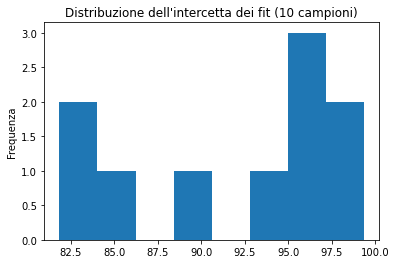

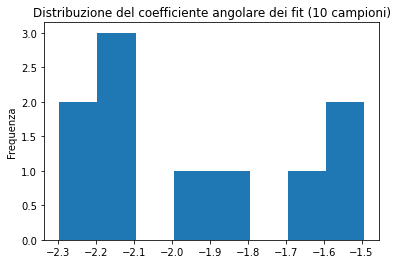

(array([3., 3., 0., 0., 2., 1., 0., 1.]),
 array([27.62867953, 32.15358763, 36.67849574, 41.20340385, 45.72831195,
        50.25322006, 54.77812817, 59.30303627, 63.82794438]),
 <BarContainer object of 8 artists>)

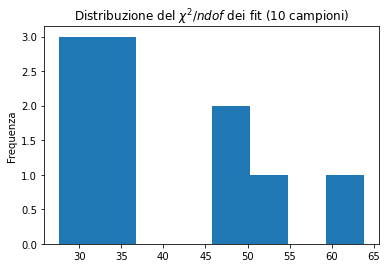

In [47]:
a_10 = [i[0] for i in fits_10]
plt.title("Distribuzione dell'intercetta dei fit (10 campioni)")
plt.ylabel("Frequenza")
plt.hist(a_10, bins = 8)
plt.show()
plt.title("Distribuzione del coefficiente angolare dei fit (10 campioni)")
plt.ylabel("Frequenza")
b_10 = [i[1] for i in fits_10]
plt.hist(b_10, bins = 8)
plt.show()
plt.title("Distribuzione del $\chi^2/ndof$ dei fit (10 campioni)")
plt.ylabel("Frequenza")
chi2_10 =  [i[4]/(n_data_10-4) for i in fits_10]
plt.hist(chi2_10, bins = 8)

(array([0.63079646, 1.64389381, 1.74584071, 3.54265487, 3.79115044,
        3.91221239, 1.84141593, 0.75823009, 0.13380531]),
 array([49.24      , 49.29555556, 49.35111111, 49.40666667, 49.46222222,
        49.51777778, 49.57333333, 49.62888889, 49.68444444, 49.74      ]),
 <BarContainer object of 9 artists>)

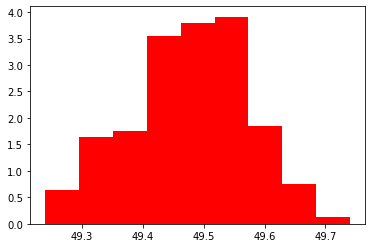

In [48]:
plt.hist(dataframe_10["y_9"], bins = 9, color = "red", density= True)

(array([0.77097345, 1.34725664, 1.76778761, 1.73663717, 3.62123894,
        4.63362832, 4.71929204, 1.12141593, 1.62761062, 0.49061947,
        0.16353982]),
 array([49.24      , 49.28545455, 49.33090909, 49.37636364, 49.42181818,
        49.46727273, 49.51272727, 49.55818182, 49.60363636, 49.64909091,
        49.69454545, 49.74      ]),
 <BarContainer object of 11 artists>)

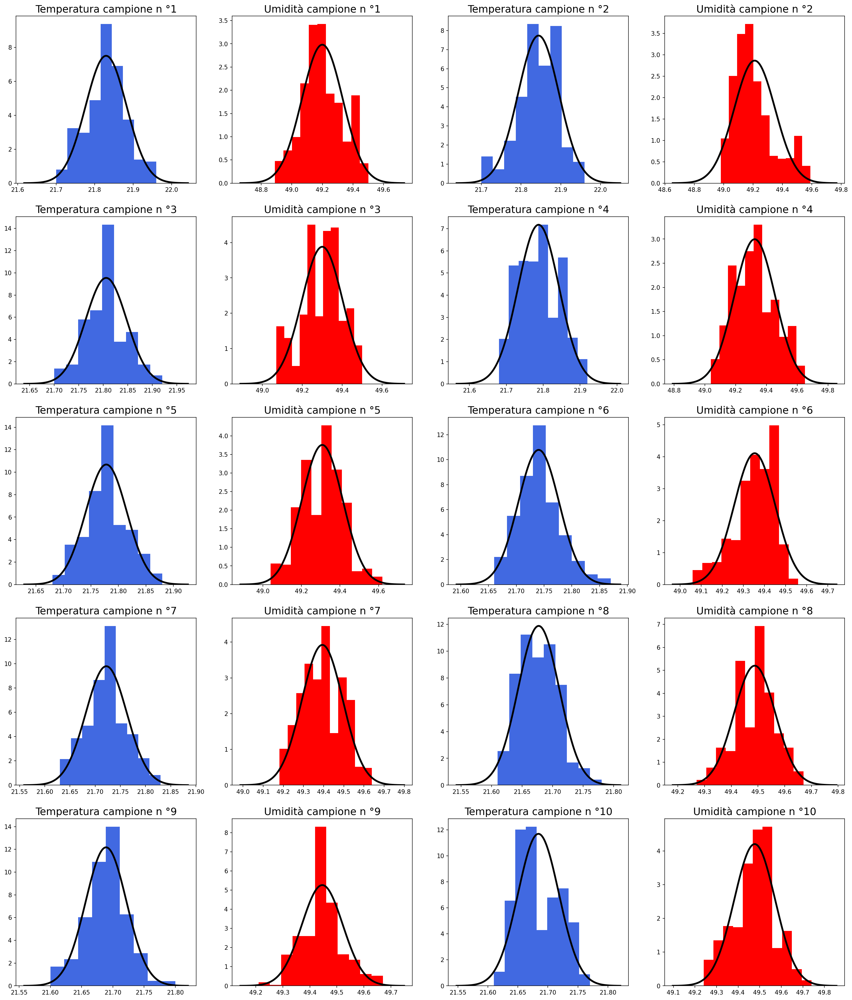

In [49]:
figg, axxsh = plt.subplots(nrows = 5,ncols=4, figsize = (25,30), dpi = 150)

for q in range (20):
    j = q%4
    i = q//4
    half = q//2
    
        
    if j== 0 or j==2:
        column= "x_"+str(half)
        axxsh[i,j].hist(dataframe_10[column], bins = 9, color = "royalblue", density = True)
        axxsh[i,j].set_title("Temperatura campione n °" + str(half+1), fontsize = 17)
        g = gaussiana (dataframe_10[column])
        axxsh[i,j].plot(g[0], g[1], color = "black", linewidth = 3)

    else:
        
        column= "y_"+str(half)
        axxsh[i,j].set_title("Umidità campione n °" + str(half+1), fontsize = 17)
        axxsh[i,j].hist(dataframe_10[column], bins = 11, color = "red", density= True)
       
            
        
        g = gaussiana (dataframe_10[column])

        axxsh[i,j].plot(g[0], g[1], color = "black", linewidth = 3)

axxsh[4,3].set_title("Umidità campione n °" + str(10), fontsize = 17)        
axxsh[4,3].hist(dataframe_10["y_9"], bins = 11, color = "red", density= True)
#g = gaussiana (dataframe_10["y_9"])

#axxsh[4,3].plot(g[0], g[1], color = "black", linewidth = 3)
  

Attenzione: i fit sono stati fatti supponendo un errore sulle y (temperatura) pari a 0.01 gradi



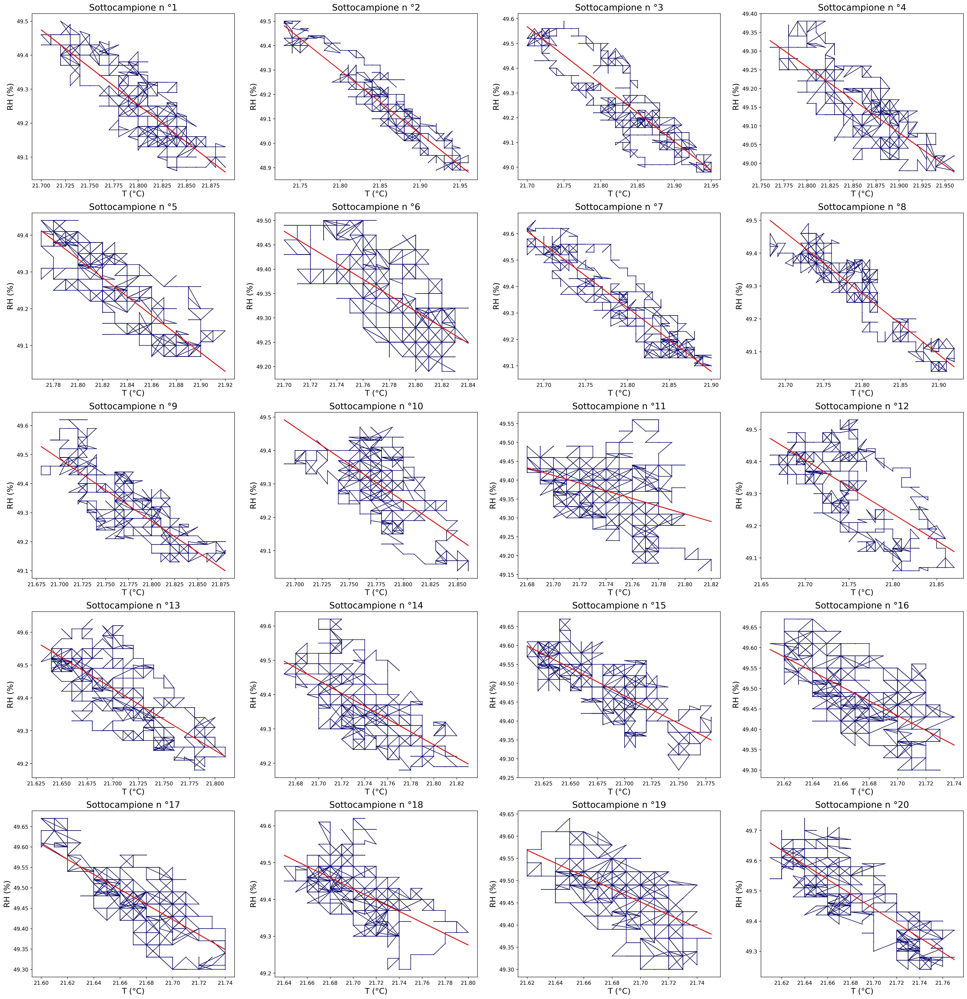

In [50]:
fig, axs = plt.subplots(5,4, figsize = (32,34), dpi = 250)
correlations_20 = []
correlations_errors_20 = []
n_data_20= 1412
fits_20 = []
dataframe_20 = pd.DataFrame()

for q in range (20):
    j = q%4
    i = q//4
    
    step = q*n_data_20
    step_1 = step + n_data_20
    locx ,locy = list(data["temp_corr"][step:step_1]) , list(data["RH_true"][step:step_1])
    localdic = {"x_"+str(q): locx, "y_"+str(q): locy}
    axs[i,j].plot(locx ,locy , "-o", color = "navy", markersize  =0.5, linewidth = 1)
    axs[i,j].set_title("Sottocampione n °" + str(q+1), fontsize = 17)
    axs[i,j].set_ylabel("RH (%)", fontsize = 15)
    axs[i,j].set_xlabel("T (°C)", fontsize = 15)
    localdf= pd.DataFrame(localdic)
    params = fit(locx ,locy, 0.01)
    y_retta = [retta(params[1], params[0], i ) for i in locx]
    axs[i,j].plot(locx, y_retta, color = "red")
    P = localdf["x_"+str(q)].corr(localdf["y_"+str(q)])
    correlations_20.append(P)
    correlations_errors_20.append(error_corr(P, n_data_20))
    dataframe_20["x_"+str(q)], dataframe_20["y_"+str(q)] = localdf["x_"+str(q)],localdf["y_"+str(q)]
    fits_20.append(params)
    

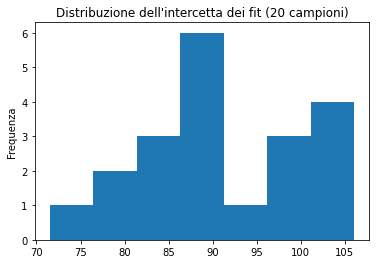

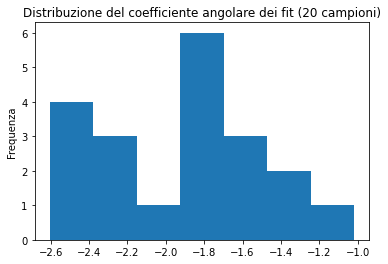

(array([3., 7., 3., 4., 1., 0., 2.]),
 array([17.61821055, 25.60640807, 33.59460558, 41.5828031 , 49.57100061,
        57.55919813, 65.54739564, 73.53559316]),
 <BarContainer object of 7 artists>)

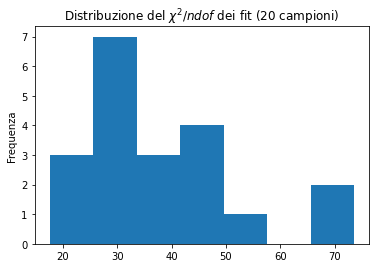

In [51]:
a_20 = [i[0] for i in fits_20]
plt.title("Distribuzione dell'intercetta dei fit (20 campioni)")
plt.ylabel("Frequenza")
plt.hist(a_20, bins = 7)
plt.show()
plt.title("Distribuzione del coefficiente angolare dei fit (20 campioni)")
plt.ylabel("Frequenza")
b_20 = [i[1] for i in fits_20]
plt.hist(b_20, bins = 7)
plt.show()
plt.title("Distribuzione del $\chi^2/ndof$ dei fit (20 campioni)")
plt.ylabel("Frequenza")
chi2_20 =  [i[4]/(n_data_20-4) for i in fits_20]
plt.hist(chi2_20, bins = 7)

**da fare**: distribuzione degli a dei b, mettere guassiane giù e migliorare il binning e le etichette

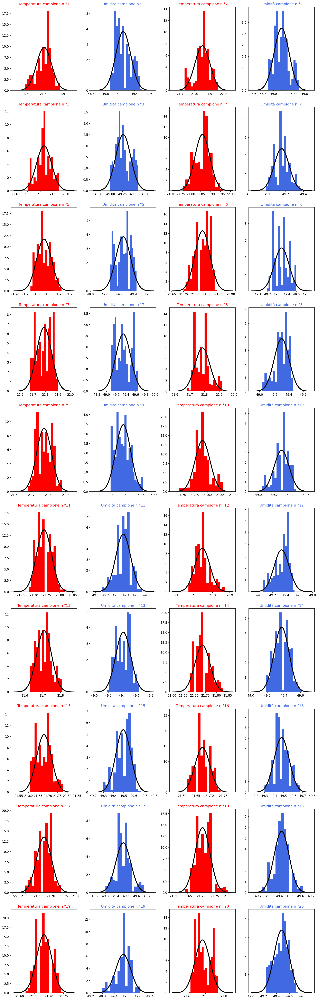

In [52]:
fig, axsh = plt.subplots(10,4, figsize = (18,60), dpi = 150)

for q in range (40):
    j = q%4
    i = q//4
    half = q//2
    if j== 0 or j==2:
        column= "x_"+str(half)
        axsh[i,j].hist(dataframe_20[column], bins = 16,color = "red", density = True)
        axsh[i,j].set_title("Temperatura campione n °" + str(half+1), fontsize = 12, color = "red")
        g = gaussiana (dataframe_20[column])
        axsh[i,j].plot(g[0], g[1], color = "black", linewidth = 3)

    else:
        column= "y_"+str(half)
        axsh[i,j].hist(dataframe_20[column], bins = 16,color = "royalblue", density = True)
        axsh[i,j].set_title("Umidità campione n °" + str(half+1), fontsize = 12, color = "royalblue")
        g = gaussiana (dataframe_20[column])
        axsh[i,j].plot(g[0], g[1], color = "black", linewidth = 3)


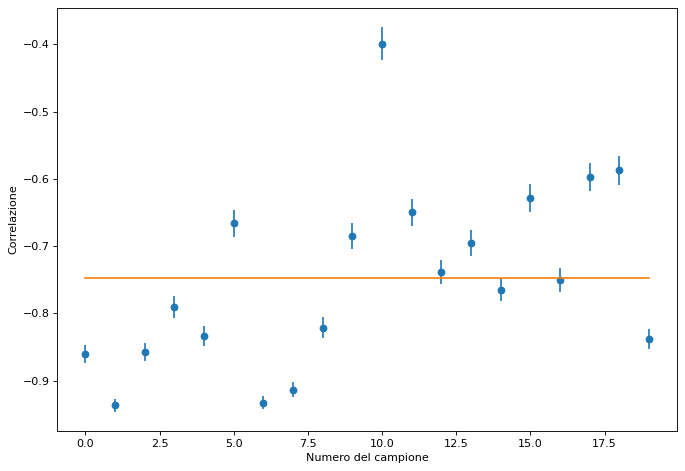

In [53]:
plt.figure(figsize=(10,7), dpi = 80 )
plt.ylabel("Correlazione")
plt.xlabel("Numero del campione")
interval = [i for i in range(len(correlations_20))]
plt.scatter(interval,correlations_20, marker = "o")
plt.errorbar(interval,correlations_20, yerr = correlations_errors_20, ls = "none")
media_rho_a20 = np.mean(correlations_20)
plt.plot(interval, [media_rho_a20 for i in range(len(correlations_errors_20))])


<Figure size 800x560 with 0 Axes>

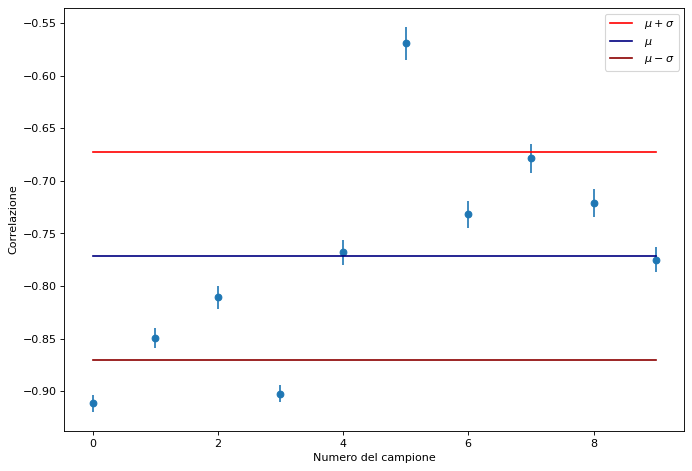

In [54]:
plt.figure(figsize=(10,7), dpi = 80 )
plt.figure(figsize=(10,7), dpi = 80 )
plt.ylabel("Correlazione")
plt.xlabel("Numero del campione")
interval = [i for i in range(len(correlations_10))]
plt.scatter(interval,correlations_10, marker = "o")
plt.errorbar(interval,correlations_10, yerr = correlations_errors_10, ls = "none")
media_rho_10 = np.mean(correlations_10)
std_rho_a10= np.std(correlations_10)
plt.plot(interval,  [media_rho_10+std_rho_a10 for i in range(len(correlations_errors_10))], color = "red", label = " $\mu +\sigma$ ")
plt.plot(interval, [media_rho_10 for i in range(len(correlations_errors_10))], color = "navy" , label = " $\mu $" )
plt.plot(interval,  [media_rho_10-std_rho_a10 for i in range(len(correlations_errors_10))],color = "darkred", label = " $\mu -\sigma$ ")
plt.legend()

(array([2., 1., 3., 2., 1., 0., 1.]),
 array([-0.91175905, -0.86281362, -0.81386818, -0.76492275, -0.71597732,
        -0.66703189, -0.61808645, -0.56914102]),
 <BarContainer object of 7 artists>)

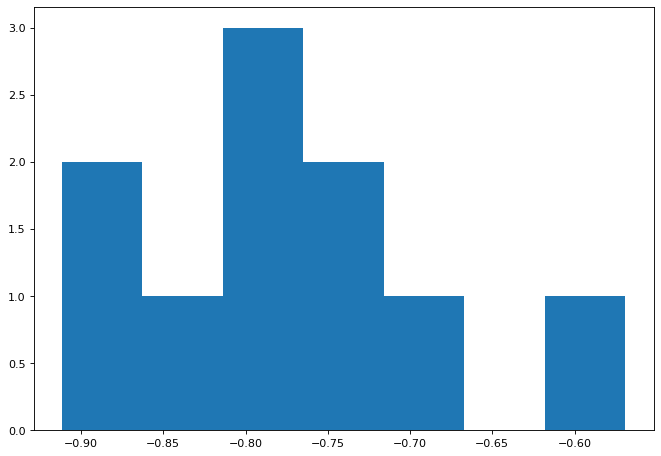

In [55]:
plt.figure(figsize=(10,7), dpi = 80 )
plt.hist(correlations_10,bins = 7)

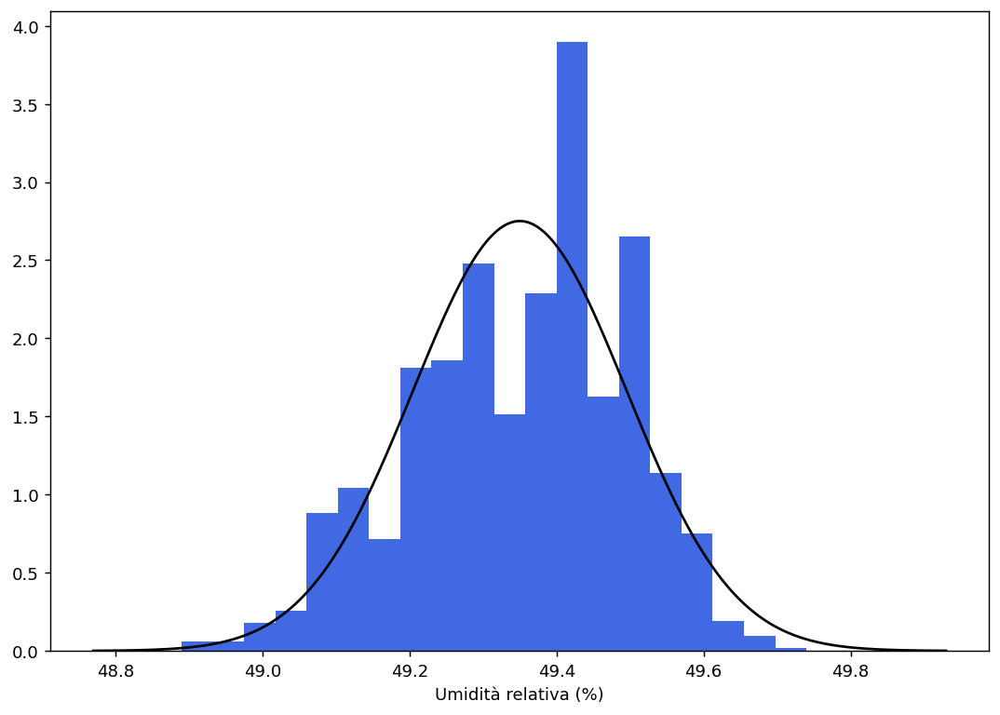

In [56]:
plt.figure(figsize=(10,7), dpi = 130 )
modello_normale = gaussiana(data["RH_true"])
plt.plot(modello_normale[0], modello_normale[1], color = "black")
b = plt.hist(data["RH_true"] , density = True, bins= 20, color = "royalblue") 
plt.xlabel("Umidità relativa (%)")
plt.show()


Text(0.5, 0, 'Temperatura (°C)')

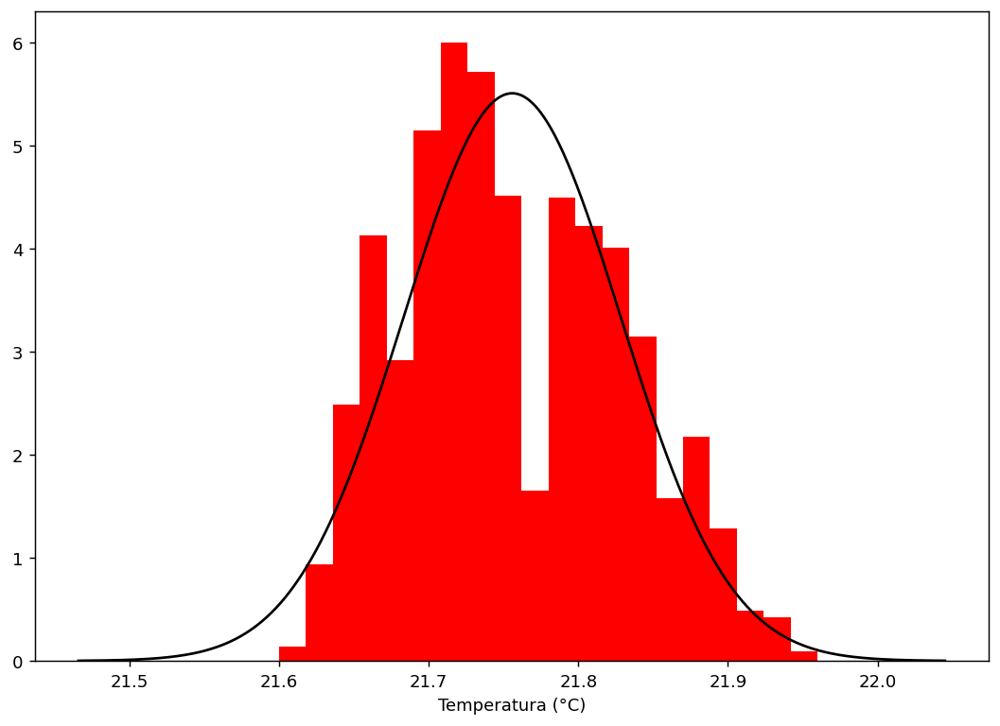

In [57]:
plt.figure(figsize=(10,7), dpi = 130 )
g_temp = gaussiana (data["temp_corr"])
plt.plot(g_temp [0], g_temp [1], color = "black")
plt.hist(data["temp_corr"] , density = True, color= "red", bins =20) 
plt.xlabel("Temperatura (°C)")

In [58]:
data["RH_true"]

0        49.16
1        49.16
2        49.16
3        49.16
4        49.16
         ...  
28245    49.28
28246    49.24
28247    49.24
28248    49.24
28249    49.27
Name: RH_true, Length: 28250, dtype: float64

In [59]:
from matplotlib import colors
from matplotlib.ticker import PercentFormatter

Text(0, 0.5, 'Temperatura (°C)')

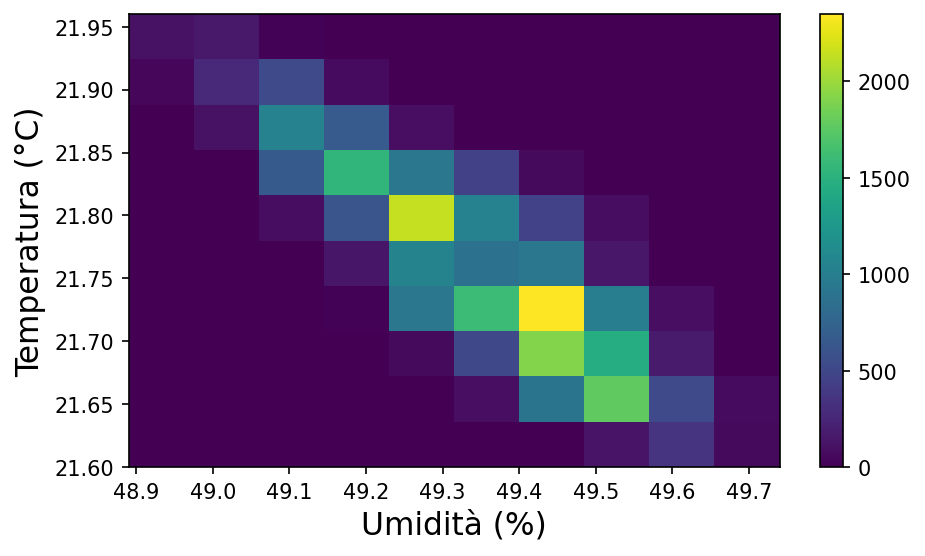

In [60]:
F, AX = plt.subplots(figsize=(7,4), dpi = 150)
h, x_h, y_h, inutile  = plt.hist2d(data["RH_true"] ,data["temp_corr"],cmap = "viridis" )
plt.colorbar(inutile, ax = AX)
plt.xlabel("Umidità (%)", fontsize =15)
plt.ylabel("Temperatura (°C)", fontsize =15)

In [61]:
h[0]

array([  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,  43., 104.])

In [62]:
heatmap_total = np.flip(h[0])
for i in range(1,len(h)):
    toflip = h[i]
    flipped = np.flip(toflip)
    heatmap_total = np.vstack((heatmap_total,flipped))

In [63]:
x_h_r = [round(i,2) for i in x_h]
y_h_r = [round(i,2) for i in y_h]

(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5]),
 [Text(0.5, 0, '48.89'),
  Text(1.5, 0, '48.98'),
  Text(2.5, 0, '49.06'),
  Text(3.5, 0, '49.14'),
  Text(4.5, 0, '49.23'),
  Text(5.5, 0, '49.32'),
  Text(6.5, 0, '49.4'),
  Text(7.5, 0, '49.48'),
  Text(8.5, 0, '49.57'),
  Text(9.5, 0, '49.66'),
  Text(10.5, 0, '49.74')])

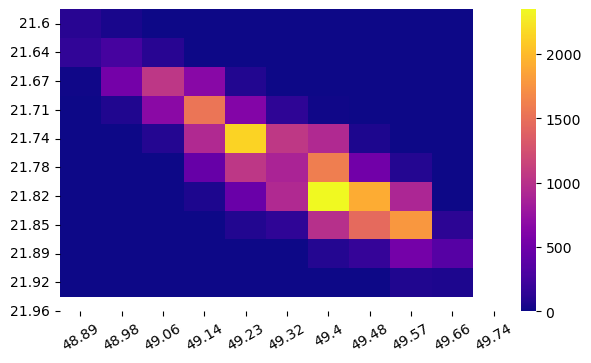

In [64]:
plt.figure(figsize=(7,4), dpi = 100 )
hhhh = heatmap(heatmap_total, cmap = "plasma", xticklabels= x_h_r, yticklabels = y_h_r)
#hhhh.set(xlabels = x_h)
plt.xticks(rotation = 30)

In [65]:
s = 0
correlations = []
sets = []
step = 500
for i in range(step+1,28000,step):
    a =  data["RH_true"][i-step+1:i]
    
    b = data["temp_corr"][i-step+1:i]
    corr = np.corrcoef(a,b)
    s +=1
    sets.append(s)
    

    correlations.append(corr[0,1])

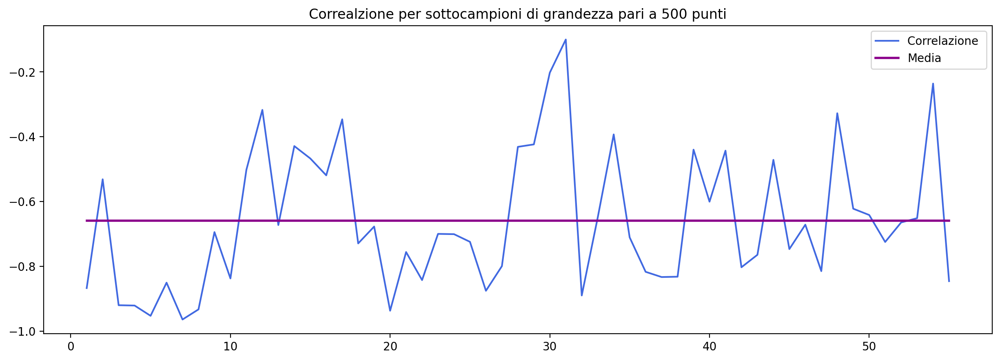

In [66]:
mediacor_tot = np.mean(correlations)
plt.figure(figsize=(15, 5), dpi= 200)
plt.title(label ="Correalzione per sottocampioni di grandezza pari a "+str(step)+ " punti")
plt.plot(sets,correlations, label = "Correlazione ", color = "royalblue")
plt.plot(sets,[mediacor_tot for i in sets], color = "darkmagenta", linewidth = 2, label = "Media")
plt.legend()

In [67]:
s = 0
correlations = []
sets = []
step = 100
for i in range(step+1,28000,step):
    a =  data["RH_true"][i-step+1:i]
    
    b = data["temp_corr"][i-step+1:i]
    corr = np.corrcoef(a,b)
    s +=1
    sets.append(s)
    

    correlations.append(corr[0,1])

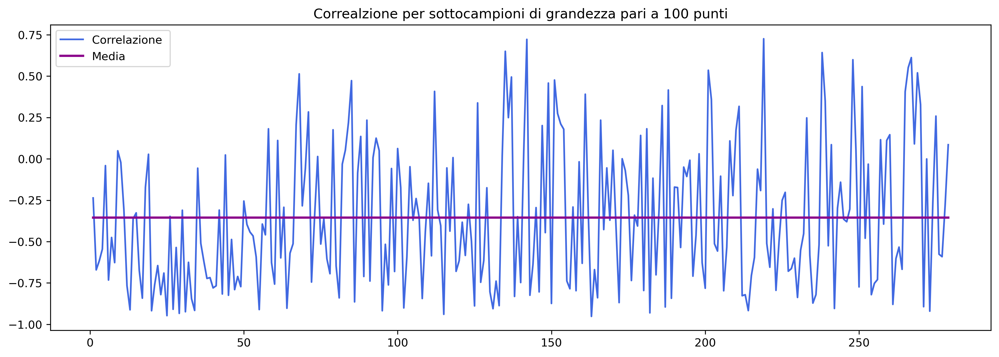

In [68]:
mediacor_tot = np.mean(correlations)
plt.figure(figsize=(15, 5), dpi= 300)
plt.title(label ="Correalzione per sottocampioni di grandezza pari a "+str(step)+ " punti")
plt.plot(sets,correlations, label = "Correlazione ", color = "royalblue")
plt.plot(sets,[mediacor_tot for i in sets], color = "darkmagenta", linewidth = 2, label = "Media")
plt.legend()

In [69]:
s = 0
correlations = []
sets = []
step = 1000
for i in range(step+1,28000,step):
    a =  data["RH_true"][i-step+1:i]
    
    b = data["temp_corr"][i-step+1:i]
    corr = np.corrcoef(a,b)
    s +=1
    sets.append(s)
    

    correlations.append(corr[0,1])

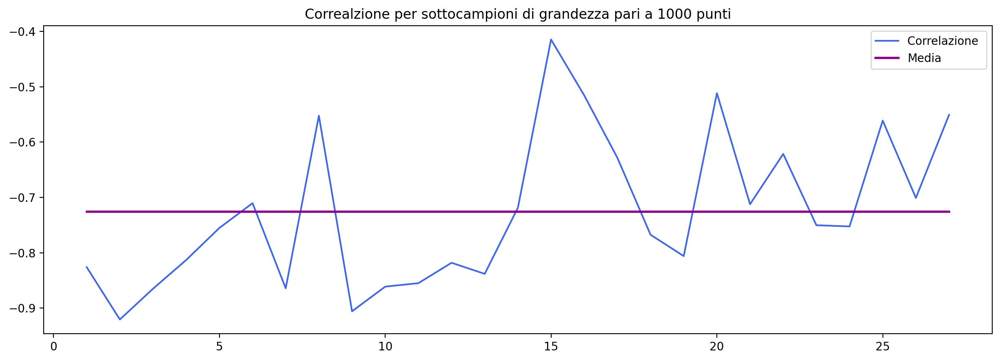

In [70]:
mediacor_tot = np.mean(correlations)
plt.figure(figsize=(15, 5), dpi= 200)
plt.title(label ="Correalzione per sottocampioni di grandezza pari a "+str(step)+ " punti")
plt.plot(sets,correlations, label = "Correlazione ", color = "royalblue")
plt.plot(sets,[mediacor_tot for i in sets], color = "darkmagenta", linewidth = 2, label = "Media")
plt.legend()

**Punto e**: seleziono i 1000 punti centrali

In [71]:
len(data["temp_corr"] )/2+500

14625.0

In [72]:
central_temp = data["temp_corr"][13625:14625]
central_RH = data["RH_true"][13625:14625]

**Campioni di 5 punti**

C:\Users\Lorenzo\Desktop\Lab4\Esperienza Iacovacci\fit_pesato_3.py:25: RuntimeWarning: invalid value encountered in double_scalars
  A_mc = (XX*Y-X*XY)/delta
C:\Users\Lorenzo\Desktop\Lab4\Esperienza Iacovacci\fit_pesato_3.py:26: RuntimeWarning: invalid value encountered in double_scalars
  B_mc = (W*XY-X*Y)/delta
C:\Users\Lorenzo\Desktop\Lab4\Esperienza Iacovacci\fit_pesato_3.py:27: RuntimeWarning: divide by zero encountered in double_scalars
  sigmaAmc=(XX/delta)**0.5
C:\Users\Lorenzo\Desktop\Lab4\Esperienza Iacovacci\fit_pesato_3.py:28: RuntimeWarning: divide by zero encountered in double_scalars
  sigmaBmc=(W/delta)**0.5
C:\Users\Lorenzo\Desktop\Lab4\Esperienza Iacovacci\fit_pesato_3.py:25: RuntimeWarning: invalid value encountered in double_scalars
  A_mc = (XX*Y-X*XY)/delta
C:\Users\Lorenzo\Desktop\Lab4\Esperienza Iacovacci\fit_pesato_3.py:26: RuntimeWarning: invalid value encountered in double_scalars
  B_mc = (W*XY-X*Y)/delta
C:\Users\Lorenzo\Desktop\Lab4\Esperienza Iacovacci\fi

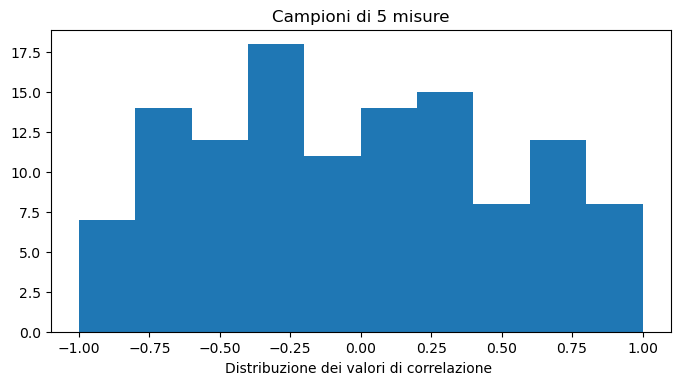

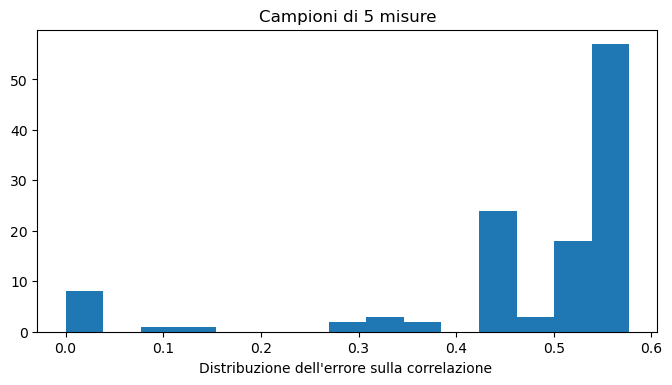

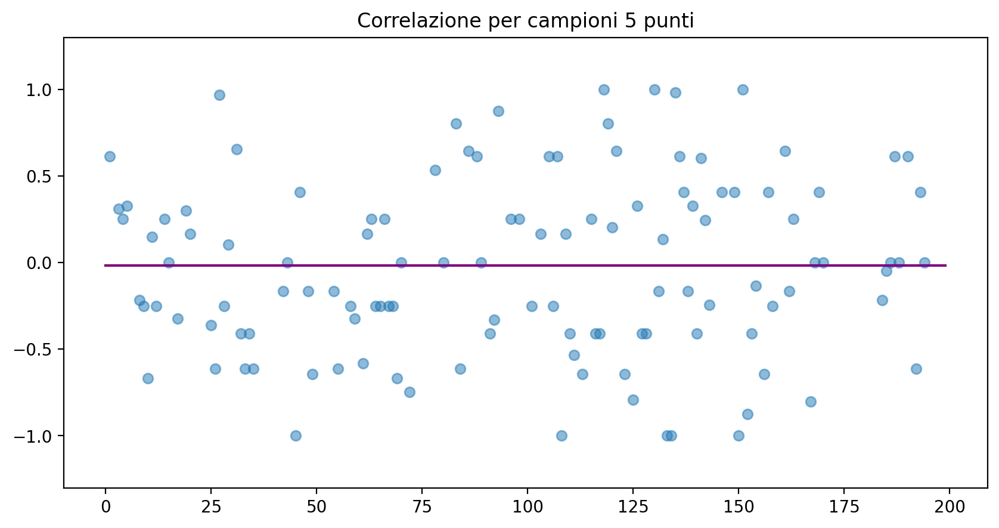

In [73]:
l_campioncini = 5
rho_campioncini = []
drho_campioncini =[]
fit_campioncini = []
for i in range(l_campioncini,len(central_temp)+1,l_campioncini):
    Tlocc = central_temp[i-l_campioncini:i]
    RHlocc = central_RH[i-l_campioncini:i]
    pallino = {"T":Tlocc, "RH" : RHlocc }
    pinco = pd.DataFrame(pallino).reset_index()
    fittionio = fit(pinco["RH"], pinco["T"], 0.01)
    fit_campioncini.append(fittionio)
    CORR = pinco["RH"].corr(pinco["T"])
    #print("CORRELAZIONE", CORR)
    rho_campioncini.append(CORR)
    drho_campioncini.append(d_rho(CORR, l_campioncini))
plt.figure(figsize=(8, 4), dpi= 100)
plt.hist(rho_campioncini, bins = 10)
plt.title("Campioni di " +str(l_campioncini)+ " misure")
plt.xlabel("Distribuzione dei valori di correlazione ")
plt.show()
plt.figure(figsize=(8, 4), dpi= 100)
plt.title("Campioni di " +str(l_campioncini)+ " misure")
plt.hist(drho_campioncini, bins = 15)
plt.xlabel("Distribuzione dell'errore sulla correlazione ")
plt.show()
numero_campioncini = [i for i in range(len(rho_campioncini))]
plt.figure(figsize=(10, 5), dpi= 200)
plt.ylim(-1.3,1.3)
plt.scatter(numero_campioncini, rho_campioncini, alpha = 0.5)
#plt.errorbar(numero_campioncini, rho_campioncini, yerr = drho_campioncini, ls= "none")
media_rho_campioncini = media(rho_campioncini) 
y_media_c = [media_rho_campioncini for f in numero_campioncini]
plt.title("Correlazione per campioni "+str(l_campioncini)+ " punti")
plt.plot(numero_campioncini, y_media_c, color = "purple")

In [74]:
b_fit_camp = []
a_fit_camp = []
delta_a = []
delta_b = []
for i in range(len(fit_campioncini)):
    if math.isinf(fit_campioncini[i][1]) == False and math.isinf(fit_campioncini[i][3]) == False:
        a_fit_camp.append(fit_campioncini[i][1])
        delta_a.append(fit_campioncini[i][3])
        
    else:
        a_fit_camp.append(np.nan)
        delta_a.append(np.nan)
for i in range(len(fit_campioncini)):
    if math.isinf(fit_campioncini[i][0]) == False and math.isinf(fit_campioncini[i][2]) == False:
        b_fit_camp.append(fit_campioncini[i][0])
        delta_b.append(fit_campioncini[i][2])
    else:
        b_fit_camp.append(np.nan)
        delta_b.append(np.nan)

(array([ 1.,  0.,  0.,  1.,  7., 21., 90., 32., 22.,  3.]),
 array([-1.99999993, -1.69999993, -1.39999994, -1.09999995, -0.79999996,
        -0.49999996, -0.19999997,  0.10000002,  0.40000001,  0.70000001,
         1.        ]),
 <BarContainer object of 10 artists>)

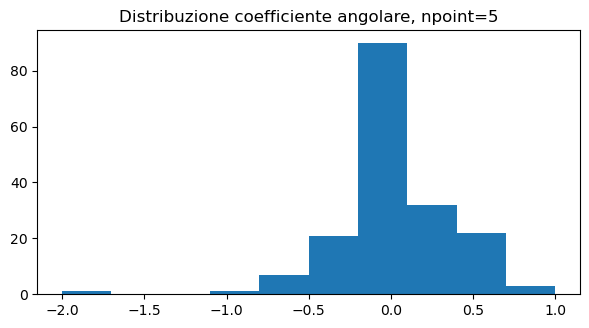

In [75]:
plt.figure(figsize=(7, 3.5), dpi= 100)
plt.title("Distribuzione coefficiente angolare, npoint="+ str(l_campioncini))
plt.hist(a_fit_camp)


(array([ 4., 16., 92., 52.,  8.,  3.,  1.,  0.,  0.,  1.]),
 array([-19.32166667,  -5.34550037,   8.63066593,  22.60683224,
         36.58299854,  50.55916484,  64.53533114,  78.51149744,
         92.48766374, 106.46383004, 120.43999634]),
 <BarContainer object of 10 artists>)

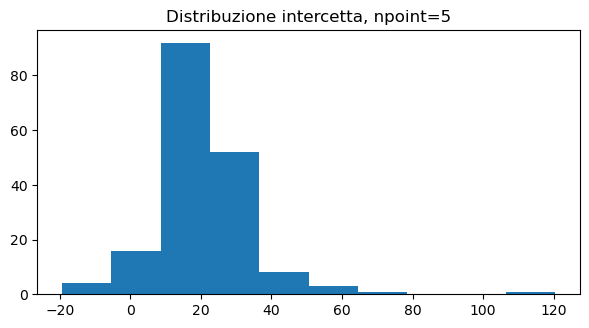

In [76]:
plt.figure(figsize=(7, 3.5), dpi= 100)
plt.title("Distribuzione intercetta, npoint="+ str(l_campioncini))
plt.hist(b_fit_camp)

(array([131.,   0.,   0.,   0.,   0.,   0.,   0.,   3.,   0.,  42.]),
 array([2.28217732e-01, 7.15747149e+02, 1.43126608e+03, 2.14678501e+03,
        2.86230394e+03, 3.57782287e+03, 4.29334180e+03, 5.00886073e+03,
        5.72437967e+03, 6.43989860e+03, 7.15541753e+03]),
 <BarContainer object of 10 artists>)

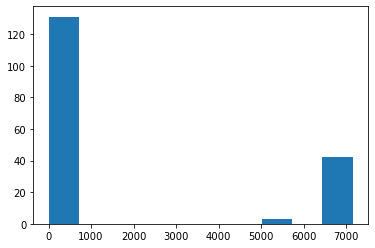

In [77]:
plt.hist(delta_a)

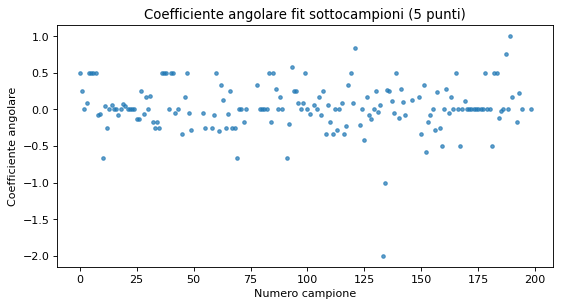

In [78]:
plt.figure(figsize=(8,4), dpi = 80 )
n_ccini_a = [i for i in range(len(a_fit_camp))]

plt.scatter(n_ccini_a,a_fit_camp, alpha = 0.7, s=10)
#plt.errorbar(n_ccini_a,a_fit_camp, yerr = delta_a, ls = "none")
plt.title("Coefficiente angolare fit sottocampioni ("+str(l_campioncini)+" punti)")
plt.xlabel ("Numero campione")
plt.ylabel("Coefficiente angolare")
plt.show()


Text(0.5, 1.0, 'Intercetta fit sottocampioni (5 punti)')

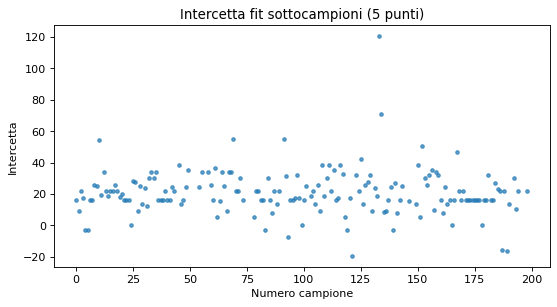

In [79]:
plt.figure(figsize=(8,4), dpi = 80 )
n_ccini_b = [i for i in range(len(b_fit_camp))]
plt.scatter(n_ccini_b, b_fit_camp, alpha = 0.7, s=10)
plt.xlabel ("Numero campione")
plt.ylabel("Intercetta")
plt.title("Intercetta fit sottocampioni ("+str(l_campioncini)+" punti)")

**CAMPIONCINI DI 10 PUNTI**

C:\Users\Lorenzo\Desktop\Lab4\Esperienza Iacovacci\fit_pesato_3.py:25: RuntimeWarning: invalid value encountered in double_scalars
  A_mc = (XX*Y-X*XY)/delta
C:\Users\Lorenzo\Desktop\Lab4\Esperienza Iacovacci\fit_pesato_3.py:26: RuntimeWarning: invalid value encountered in double_scalars
  B_mc = (W*XY-X*Y)/delta
C:\Users\Lorenzo\Desktop\Lab4\Esperienza Iacovacci\fit_pesato_3.py:27: RuntimeWarning: divide by zero encountered in double_scalars
  sigmaAmc=(XX/delta)**0.5
C:\Users\Lorenzo\Desktop\Lab4\Esperienza Iacovacci\fit_pesato_3.py:28: RuntimeWarning: divide by zero encountered in double_scalars
  sigmaBmc=(W/delta)**0.5
C:\Users\Lorenzo\Desktop\Lab4\Esperienza Iacovacci\fit_pesato_3.py:25: RuntimeWarning: invalid value encountered in double_scalars
  A_mc = (XX*Y-X*XY)/delta
C:\Users\Lorenzo\Desktop\Lab4\Esperienza Iacovacci\fit_pesato_3.py:26: RuntimeWarning: invalid value encountered in double_scalars
  B_mc = (W*XY-X*Y)/delta
C:\Users\Lorenzo\Desktop\Lab4\Esperienza Iacovacci\fi

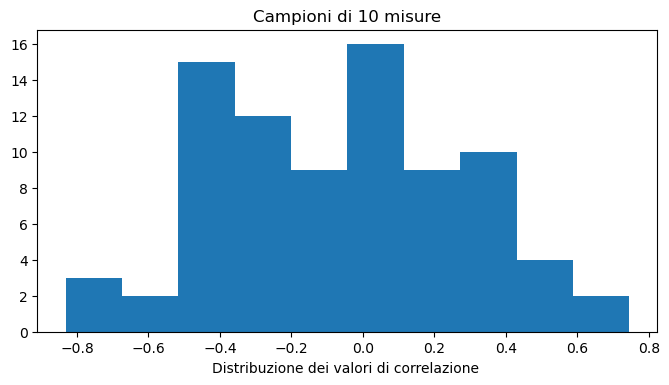

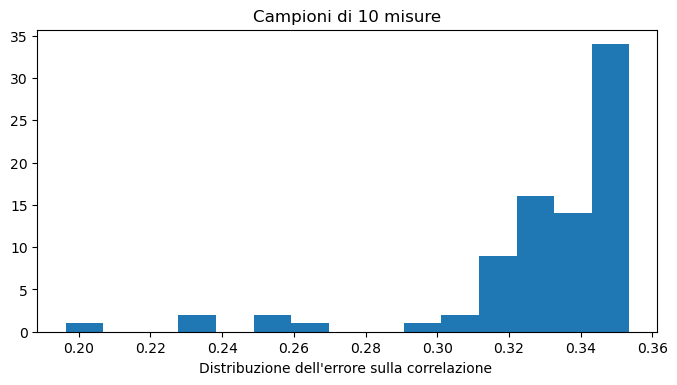

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


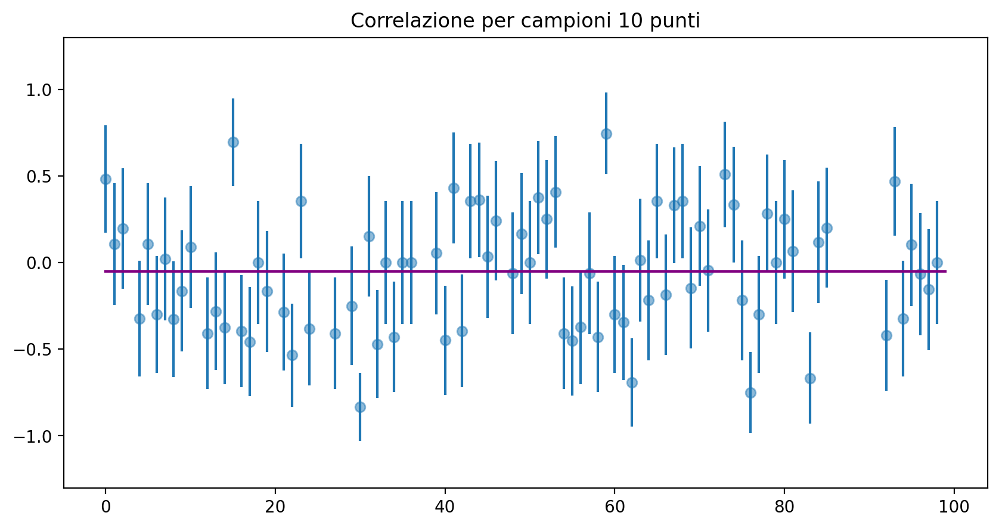

In [80]:
l_campioncini = 10
rho_campioncini = []
drho_campioncini =[]
fit_campioncini = []
for i in range(l_campioncini,len(central_temp)+1,l_campioncini):
    Tlocc = central_temp[i-l_campioncini:i]
    RHlocc = central_RH[i-l_campioncini:i]
    pallino = {"T":Tlocc, "RH" : RHlocc }
    pinco = pd.DataFrame(pallino).reset_index()
    fittionio = fit(pinco["RH"], pinco["T"], 0.01)
    fit_campioncini.append(fittionio)
    CORR = pinco["RH"].corr(pinco["T"])
    #print("CORRELAZIONE", CORR)
    rho_campioncini.append(CORR)
    drho_campioncini.append(d_rho(CORR, l_campioncini))
plt.figure(figsize=(8, 4), dpi= 100)
plt.hist(rho_campioncini, bins = 10)
plt.title("Campioni di " +str(l_campioncini)+ " misure")
plt.xlabel("Distribuzione dei valori di correlazione ")
plt.show()
plt.figure(figsize=(8, 4), dpi= 100)
plt.title("Campioni di " +str(l_campioncini)+ " misure")
plt.hist(drho_campioncini, bins = 15)
plt.xlabel("Distribuzione dell'errore sulla correlazione ")
plt.show()
numero_campioncini = [i for i in range(len(rho_campioncini))]
plt.figure(figsize=(10, 5), dpi= 200)
plt.ylim(-1.3,1.3)
plt.scatter(numero_campioncini, rho_campioncini, alpha = 0.5)
plt.errorbar(numero_campioncini, rho_campioncini, yerr = drho_campioncini, ls= "none")
media_rho_campioncini = media(rho_campioncini) 
y_media_c = [media_rho_campioncini for f in numero_campioncini]
plt.title("Correlazione per campioni "+str(l_campioncini)+ " punti")
plt.plot(numero_campioncini, y_media_c, color = "purple")

In [81]:
b_fit_camp = []
a_fit_camp = []
delta_a = []
delta_b = []
for i in range(len(fit_campioncini)):
    if math.isinf(fit_campioncini[i][1]) == False and math.isinf(fit_campioncini[i][3]) == False:
        a_fit_camp.append(fit_campioncini[i][1])
        delta_a.append(fit_campioncini[i][3])
        
    else:
        a_fit_camp.append(np.nan)
        delta_a.append(np.nan)
for i in range(len(fit_campioncini)):
    if math.isinf(fit_campioncini[i][0]) == False and math.isinf(fit_campioncini[i][2]) == False:
        b_fit_camp.append(fit_campioncini[i][0])
        delta_b.append(fit_campioncini[i][2])
    else:
        b_fit_camp.append(np.nan)
        delta_b.append(np.nan)

(array([ 2.,  2.,  4., 15., 31., 20.,  9.,  1.,  2.,  7.]),
 array([-0.59259259, -0.47333333, -0.35407407, -0.23481482, -0.11555556,
         0.0037037 ,  0.12296296,  0.24222222,  0.36148147,  0.48074073,
         0.59999999]),
 <BarContainer object of 10 artists>)

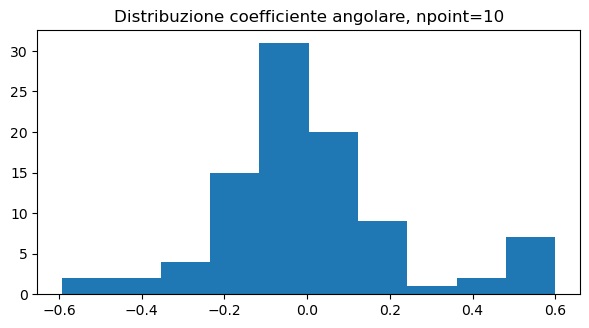

In [82]:
plt.figure(figsize=(7, 3.5), dpi= 100)
plt.title("Distribuzione coefficiente angolare, npoint="+ str(l_campioncini))
plt.hist(a_fit_camp)


(array([ 1.,  4.,  0.,  9., 31., 25., 15.,  4.,  2.,  2.]),
 array([-7.91199925, -2.02150305,  3.86899316,  9.75948936, 15.64998557,
        21.54048177, 27.43097798, 33.32147418, 39.21197038, 45.10246659,
        50.99296279]),
 <BarContainer object of 10 artists>)

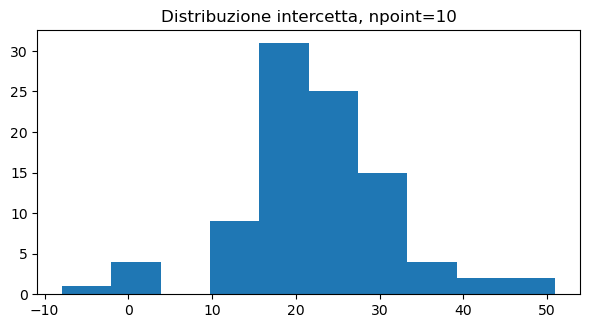

In [83]:
plt.figure(figsize=(7, 3.5), dpi= 100)
plt.title("Distribuzione intercetta, npoint="+ str(l_campioncini))
plt.hist(b_fit_camp)

(array([81.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0., 11.]),
 array([1.20912708e-01, 5.06073247e+02, 1.01202558e+03, 1.51797792e+03,
        2.02393025e+03, 2.52988258e+03, 3.03583492e+03, 3.54178725e+03,
        4.04773959e+03, 4.55369192e+03, 5.05964426e+03]),
 <BarContainer object of 10 artists>)

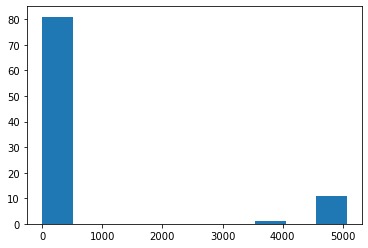

In [84]:
plt.hist(delta_a)

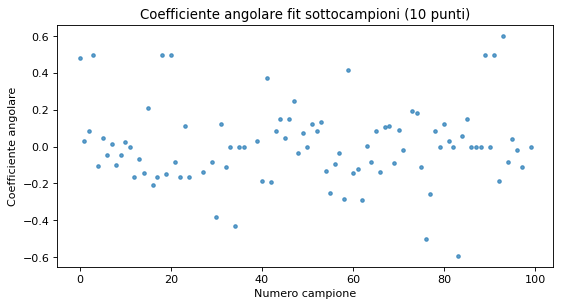

In [85]:
plt.figure(figsize=(8,4), dpi = 80 )
n_ccini_a = [i for i in range(len(a_fit_camp))]

plt.scatter(n_ccini_a,a_fit_camp, alpha = 0.7, s=10)
#plt.errorbar(n_ccini_a,a_fit_camp, yerr = delta_a, ls = "none")
plt.title("Coefficiente angolare fit sottocampioni ("+str(l_campioncini)+" punti)")
plt.xlabel ("Numero campione")
plt.ylabel("Coefficiente angolare")
plt.show()


Text(0.5, 1.0, 'Intercetta fit sottocampioni (10 punti)')

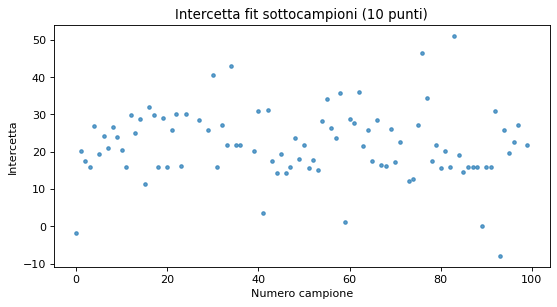

In [86]:
plt.figure(figsize=(8,4), dpi = 80 )
n_ccini_b = [i for i in range(len(b_fit_camp))]
plt.scatter(n_ccini_b, b_fit_camp, alpha = 0.7, s=10)
plt.xlabel ("Numero campione")
plt.ylabel("Intercetta")
plt.title("Intercetta fit sottocampioni ("+ str(l_campioncini)+" punti)")

**CAMPIONCINI DI 20 PUNTI**

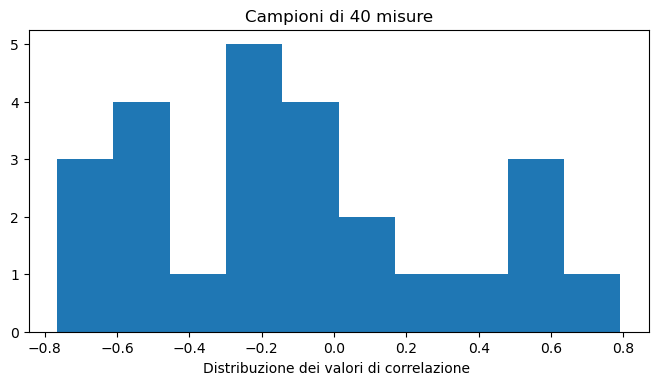

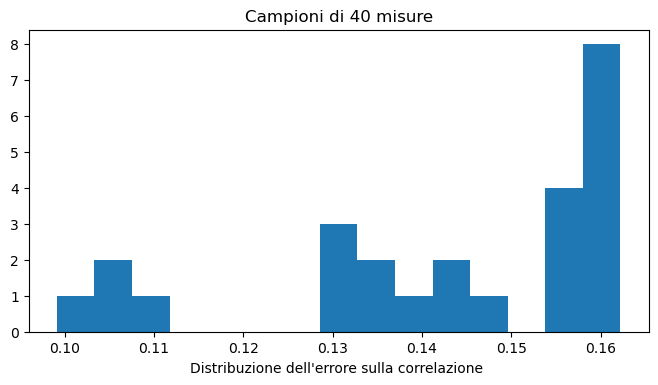

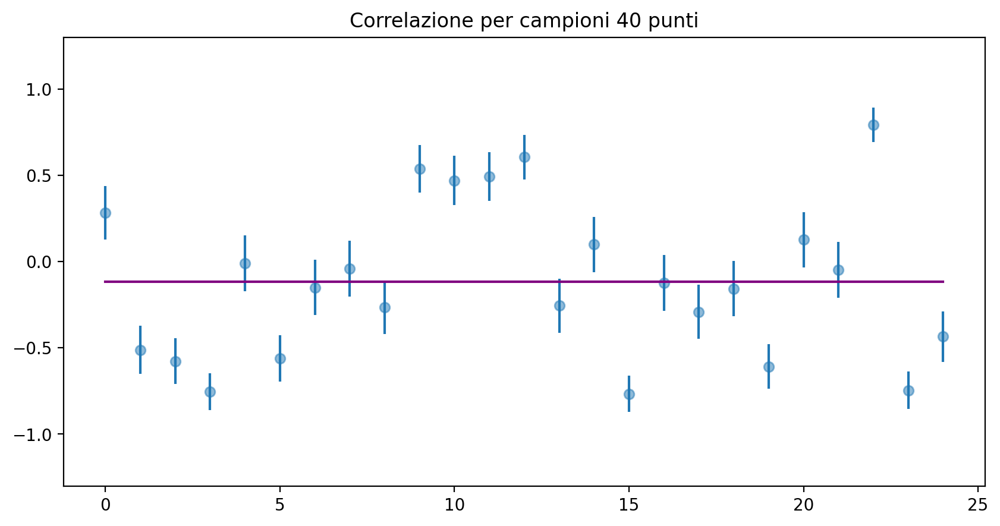

In [87]:
l_campioncini = 40
rho_campioncini = []
drho_campioncini =[]
fit_campioncini = []
for i in range(l_campioncini,len(central_temp)+1,l_campioncini):
    Tlocc = central_temp[i-l_campioncini:i]
    RHlocc = central_RH[i-l_campioncini:i]
    pallino = {"T":Tlocc, "RH" : RHlocc }
    pinco = pd.DataFrame(pallino).reset_index()
    fittionio = fit(pinco["RH"], pinco["T"], 0.01)
    fit_campioncini.append(fittionio)
    CORR = pinco["RH"].corr(pinco["T"])
    #print("CORRELAZIONE", CORR)
    rho_campioncini.append(CORR)
    drho_campioncini.append(d_rho(CORR, l_campioncini))
plt.figure(figsize=(8, 4), dpi= 100)
plt.hist(rho_campioncini, bins = 10)
plt.title("Campioni di " +str(l_campioncini)+ " misure")
plt.xlabel("Distribuzione dei valori di correlazione ")
plt.show()
plt.figure(figsize=(8, 4), dpi= 100)
plt.title("Campioni di " +str(l_campioncini)+ " misure")
plt.hist(drho_campioncini, bins = 15)
plt.xlabel("Distribuzione dell'errore sulla correlazione ")
plt.show()
numero_campioncini = [i for i in range(len(rho_campioncini))]
plt.figure(figsize=(10, 5), dpi= 200)
plt.ylim(-1.3,1.3)
plt.scatter(numero_campioncini, rho_campioncini, alpha = 0.5)
plt.errorbar(numero_campioncini, rho_campioncini, yerr = drho_campioncini, ls= "none")
media_rho_campioncini = media(rho_campioncini) 
y_media_c = [media_rho_campioncini for f in numero_campioncini]
plt.title("Correlazione per campioni "+str(l_campioncini)+ " punti")
plt.plot(numero_campioncini, y_media_c, color = "purple")

In [88]:
b_fit_camp = []
a_fit_camp = []
delta_a = []
delta_b = []
for i in range(len(fit_campioncini)):
    if math.isinf(fit_campioncini[i][1]) == False and math.isinf(fit_campioncini[i][3]) == False:
        a_fit_camp.append(fit_campioncini[i][1])
        delta_a.append(fit_campioncini[i][3])
        
    else:
        a_fit_camp.append(np.nan)
        delta_a.append(np.nan)
for i in range(len(fit_campioncini)):
    if math.isinf(fit_campioncini[i][0]) == False and math.isinf(fit_campioncini[i][2]) == False:
        b_fit_camp.append(fit_campioncini[i][0])
        delta_b.append(fit_campioncini[i][2])
    else:
        b_fit_camp.append(np.nan)
        delta_b.append(np.nan)

(array([14.,  9.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  1.]),
 array([-0.39873653, -0.04552955,  0.30767743,  0.66088441,  1.01409139,
         1.36729837,  1.72050535,  2.07371233,  2.42691931,  2.78012629,
         3.13333327]),
 <BarContainer object of 10 artists>)

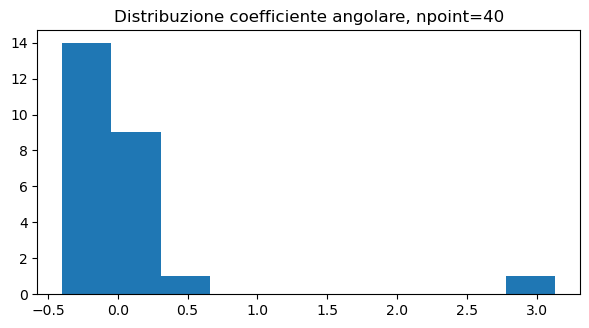

In [89]:
plt.figure(figsize=(7, 3.5), dpi= 100)
plt.title("Distribuzione coefficiente angolare, npoint="+ str(l_campioncini))
plt.hist(a_fit_camp)


(array([ 1.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  9., 14.]),
 array([-132.74933023, -115.33515633,  -97.92098243,  -80.50680853,
         -63.09263463,  -45.67846073,  -28.26428683,  -10.85011293,
           6.56406097,   23.97823487,   41.39240877]),
 <BarContainer object of 10 artists>)

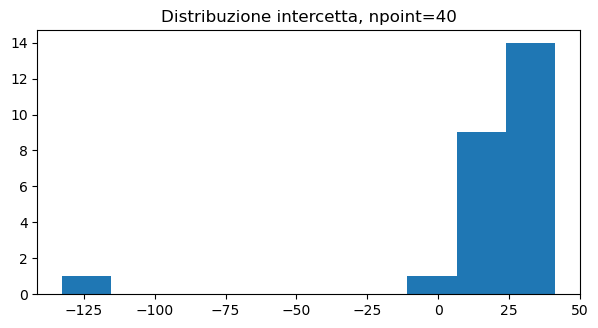

In [90]:
plt.figure(figsize=(7, 3.5), dpi= 100)
plt.title("Distribuzione intercetta, npoint="+ str(l_campioncini))
plt.hist(b_fit_camp)

(array([9., 8., 3., 4., 0., 0., 0., 0., 0., 1.]),
 array([0.03578339, 0.06871988, 0.10165638, 0.13459288, 0.16752938,
        0.20046588, 0.23340238, 0.26633887, 0.29927537, 0.33221187,
        0.36514837]),
 <BarContainer object of 10 artists>)

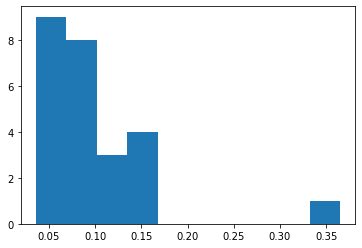

In [91]:
plt.hist(delta_a)

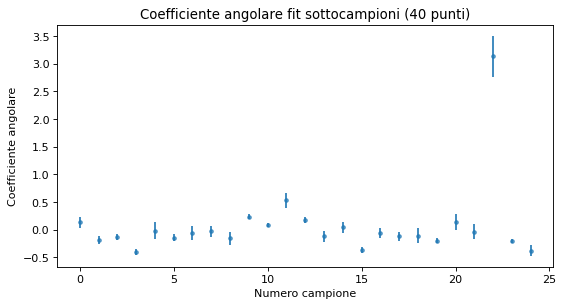

In [92]:
plt.figure(figsize=(8,4), dpi = 80 )
n_ccini_a = [i for i in range(len(a_fit_camp))]

plt.scatter(n_ccini_a,a_fit_camp, alpha = 0.7, s=10)
plt.errorbar(n_ccini_a,a_fit_camp, yerr = delta_a, ls = "none")
plt.title("Coefficiente angolare fit sottocampioni ("+str(l_campioncini)+" punti)")
plt.xlabel ("Numero campione")
plt.ylabel("Coefficiente angolare")
plt.show()


Text(0.5, 1.0, 'Intercetta fit sottocampioni (40 punti)')

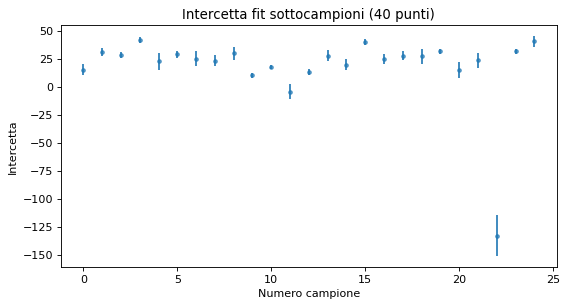

In [93]:
plt.figure(figsize=(8,4), dpi = 80 )
n_ccini_b = [i for i in range(len(b_fit_camp))]
plt.scatter(n_ccini_b, b_fit_camp, alpha = 0.7, s=10)
plt.errorbar(n_ccini_b,b_fit_camp, yerr = delta_b, ls = "none")
plt.xlabel ("Numero campione")
plt.ylabel("Intercetta")
plt.title("Intercetta fit sottocampioni ("+ str(l_campioncini)+" punti)")

(array([9., 8., 3., 4., 0., 0., 0., 0., 0., 1.]),
 array([ 1.76563349,  3.38952546,  5.01341744,  6.63730941,  8.26120138,
         9.88509335, 11.50898533, 13.1328773 , 14.75676927, 16.38066125,
        18.00455322]),
 <BarContainer object of 10 artists>)

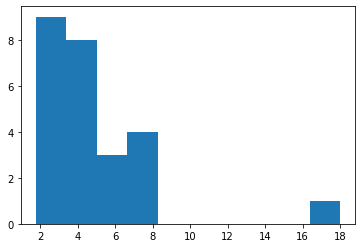

In [94]:
plt.hist(delta_b)

**Test d'ipotesi**


(array([2., 1., 3., 2., 1., 0., 1.]),
 array([-0.91175905, -0.86281362, -0.81386818, -0.76492275, -0.71597732,
        -0.66703189, -0.61808645, -0.56914102]),
 <BarContainer object of 7 artists>)

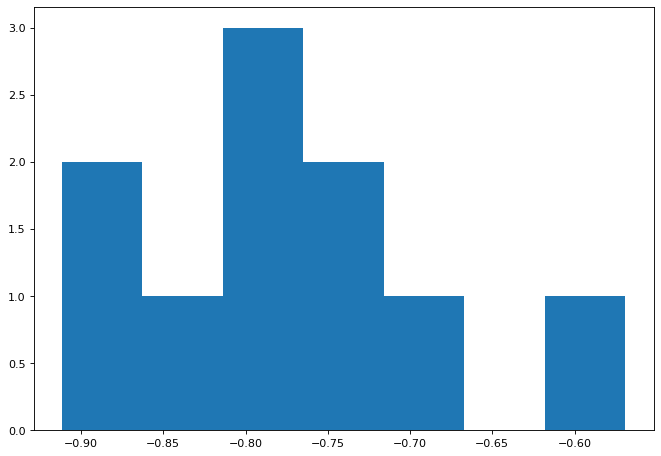

In [95]:
plt.figure(figsize=(10,7), dpi = 80 )
plt.hist(correlations_10,bins = 7)

Definiamo ora la variabile casuale $t_{\rho} = \frac{\rho \sqrt{N-2}}
{\sqrt{1-\rho^2}}$, che deve essere distribuita secondo una t-student con $N = 2825$, e dunque $\mathbb{E}(t_{\rho}) = 0 $ e $\sigma (t_{\rho}) = \frac
{N}{N-2} \approx 1$

In [134]:
n_data_10

2825

In [137]:
ts_10 = [(i*math.sqrt(n_data_10-2))/(np.sqrt(1-i**2)) for i in correlations_10]

C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\_continuous_distns.py:6315: RuntimeWarning: overflow encountered in power
  / (np.sqrt(r*np.pi)*(1+(x**2)/r)**((r+1)/2)))
C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\_continuous_distns.py:6315: RuntimeWarning: overflow encountered in multiply
  / (np.sqrt(r*np.pi)*(1+(x**2)/r)**((r+1)/2)))


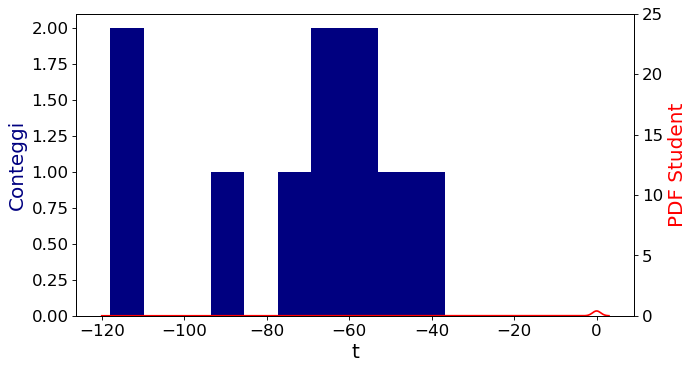

In [288]:
fig, ax = plt.subplots(figsize= (9,5), dpi = 80)

student_range_10 = np.linspace(-120,3,1000)
student_10 = [stats.t.pdf(i, n_data_10-2) for i in student_range_10]
ax.set_ylabel("Conteggi", color = "navy", fontsize= 18)
plt.xticks(fontsize= 15)
ax.hist(ts_10, color = "navy")
plt.yticks(fontsize= 15)
ax2 = ax.twinx()
ax2.plot(student_range_10,student_10 , color = "red")
ax2.set_ylabel("PDF Student",color = "red", fontsize= 18)
plt.yticks(fontsize= 15)
ax.set_xlabel("t", fontsize= 18)
plt.ylim(-0.001,25)
plt.show()

Si può fare anche un confronto del parametro $ Z = \frac{1}{2} (ln(1+\rho)-ln(1- \rho)) $ con la distribuzione di Student. In questo caso la distribuzione di Fisher tende, per molti gradi di libertà, ad una gaussiana con parametri $ \mu(Z(\rho)) = Z(\rho)$, e $\sigma^2_Z = \frac{1}{N-3}$

In [156]:
def Z (r):
    return 0.5*(np.log(1+r)-np.log(1-r))

In [178]:
Z_10 = [ Z(r) for r in correlations_10]

In [179]:
 Z(media_rho_10)

-1.024557840069307

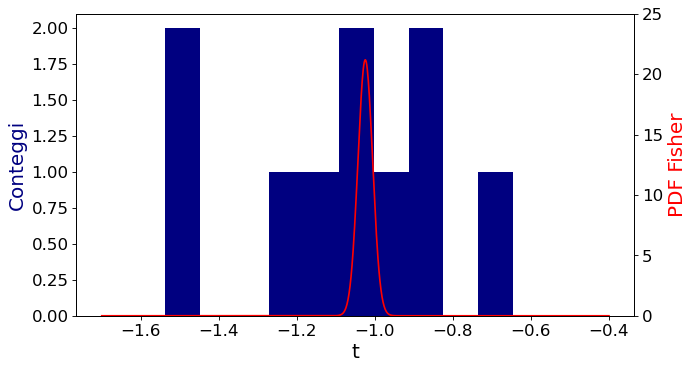

In [287]:
fig, ax = plt.subplots(figsize= (9,5), dpi = 80)

Z_range_10 = np.linspace(-1.7,-0.4,1000)
Z_10_media= Z(media_rho_10)
Z_pdf= [stats.norm.pdf(i, Z_10_media, 1/np.sqrt(n_data_10-3)) for i in Z_range_10]
ax.set_ylabel("Conteggi", color = "navy", fontsize= 18)
plt.xticks(fontsize= 15)
ax.hist(Z_10, color = "navy")
plt.yticks(fontsize= 15)
ax2 = ax.twinx()
ax2.plot(Z_range_10,Z_pdf , color = "red")
ax2.set_ylabel("PDF Fisher",color = "red", fontsize= 18)
plt.ylim(-0.001,25)
plt.yticks(fontsize= 15)
ax.set_xlabel("t", fontsize= 18)
plt.show()

Al fine di valutare la compatibilità delle varie stime di $\rho$, si può studiarela variabile $ \delta_{ij} =
\frac{Z(\rho_i)-Z(\rho_j)}{\sqrt{\frac{1}{N_i -3}} \sqrt\frac{1}{N_j-3}} $

In [269]:
def delta_10(i,j):
    return (i-j)/((1/np.sqrt(n_data_10-3)))

In [270]:
deltas_10 = []
for i in Z_10:
    for j in Z_10:
        if i!=j:
            deltas_10.append(delta_10(i,j))  

In [275]:
xD = np.linspace(-50,50,500)
yD = [stats.norm.pdf(w) for w in xD]

(-0.001, 0.41)

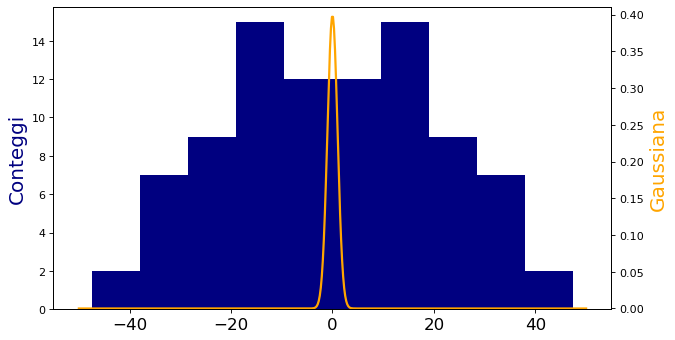

In [282]:
fig, ax = plt.subplots(figsize= (9,5), dpi = 80)

plt.xticks(fontsize= 15)

ax.set_ylabel("Conteggi", color = "navy", fontsize= 18)
ax.hist(deltas_10, color = "navy")
ax2 = ax.twinx()
ax2.plot(xD, yD, color = "orange", linewidth = 2)
ax2.set_ylabel("Gaussiana",color = "orange", fontsize= 18)
plt.ylim(-0.001,0.41)